# Modelo SVR

## Importacion de las paqueterias

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate

from sklearn.svm import SVR

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

from datetime import datetime, timedelta
import ast

import pickle

import warnings
warnings.filterwarnings('ignore')

## Importacion de los Datasets

In [2]:
# Dataset de entrenamiento
df_Nizanda = pd.read_csv('./Datasets/Nizanda_T1.csv')
df_Nizanda

,Day,Month,Year,Hour,Barometer,Temp C,High Temp C,Low Temp C,Hum %,Dew Point C,...,Wind Run,High Wind Speed m/s,High Wind Direction,Wind Chill C,Heat Index C,THW Index C,Rain mm,Rain Rate mm/h,ET mm,Date
0,1,1,2017,0,754.7,25.2,25.7,24.9,84.0,22.3,...,3.1,11.2,NW,25.2,27.3,27.3,0.0,0.0,NaN,2017-01-01 00:00:00
1,1,1,2017,1,754.5,24.6,24.9,24.4,86.0,22.1,...,3.1,11.2,WNW,24.6,26.5,26.5,0.0,0.0,NaN,2017-01-01 01:00:00
2,1,1,2017,2,754.2,24.5,24.6,24.4,81.0,21.0,...,2.7,10.7,WNW,24.5,26.2,26.2,0.0,0.0,NaN,2017-01-01 02:00:00
3,1,1,2017,3,753.9,24.4,24.6,24.2,84.0,21.5,...,3.1,10.7,WNW,24.4,26.1,26.1,0.0,0.0,NaN,2017-01-01 03:00:00
4,1,1,2017,4,753.7,24.1,24.3,24.1,86.0,21.6,...,3.1,12.5,WNW,24.1,25.9,25.9,0.0,0.0,NaN,2017-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17406,31,12,2018,19,754.6,26.6,26.8,26.4,73.0,21.4,...,2.2,9.4,N,26.6,28.4,28.4,0.0,0.0,NaN,2018-12-31 19:00:00
17407,31,12,2018,20,754.8,26.2,26.4,26.0,75.0,21.4,...,2.2,9.8,WNW,26.2,27.9,27.9,0.0,0.0,NaN,2018-12-31 20:00:00
17408,31,12,2018,21,755.0,25.9,26.0,25.8,74.0,20.9,...,2.2,8.5,N,25.9,27.4,27.4,0.0,0.0,NaN,2018-12-31 21:00:00
17409,31,12,2018,22,755.4,25.7,25.8,25.5,75.0,20.9,...,1.8,7.1,NE,25.7,27.2,27.2,0.0,0.0,NaN,2018-12-31 22:00:00


In [3]:
df_Prueba = pd.read_csv('./Datasets/Nizanda_22_Prueba.csv')
df_Prueba

,Day,Month,Year,Hour,Barometer,Temp C,High Temp C,Low Temp C,Hum %,Dew Point C,...,Wind Run,High Wind Speed m/s,High Wind Direction,Wind Chill C,Heat Index C,THW Index C,Rain mm,Rain Rate mm/h,ET mm,Date
0,1,1,2022,0,758.9,25.4,25.6,25.3,88.0,23.3,...,1.79,5.4,S,25.4,27.6,27.6,0.0,0.0,0.03,2022-01-01 00:00:00
1,1,1,2022,1,758.7,25.0,25.4,25.0,89.0,23.1,...,1.79,4.9,S,25.0,27.0,27.0,0.0,0.0,0.03,2022-01-01 01:00:00
2,1,1,2022,2,758.2,24.5,25.1,24.5,89.0,22.6,...,1.34,4.5,SSE,24.5,26.2,26.2,0.0,0.0,0.03,2022-01-01 02:00:00
3,1,1,2022,3,757.9,23.8,24.5,23.8,92.0,22.5,...,0.89,4.0,SSW,23.8,25.4,25.4,0.0,0.0,0.03,2022-01-01 03:00:00
4,1,1,2022,4,758.0,23.8,23.9,23.7,91.0,22.2,...,0.89,4.5,SSE,23.8,25.3,25.3,0.0,0.0,0.00,2022-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,31,12,2022,19,759.2,28.7,29.6,28.7,61.0,20.5,...,2.24,8.5,W,28.7,30.7,30.7,0.0,0.0,0.08,2022-12-31 19:00:00
8756,31,12,2022,20,759.6,28.3,28.8,28.3,63.0,20.6,...,1.79,7.6,ENE,28.3,30.3,30.3,0.0,0.0,0.08,2022-12-31 20:00:00
8757,31,12,2022,21,760.1,27.7,28.3,27.7,67.0,21.0,...,1.79,6.7,NW,27.7,29.9,29.9,0.0,0.0,0.08,2022-12-31 21:00:00
8758,31,12,2022,22,760.5,27.2,27.8,27.2,73.0,21.9,...,2.24,8.5,NE,27.2,29.7,29.7,0.0,0.0,0.05,2022-12-31 22:00:00


In [3]:
# Creacion del diccionario resultados_LR
resSvr = {'Modelo': [], 'Horizon': [], 'R2': [], 'RSME': [], 'MAE': [], 'Comb': [], 'Params': []}

# Transformacion de diccionario a Dataframe
df_SVR = pd.DataFrame(resSvr)
df_SVR

,Modelo,Horizon,R2,RSME,MAE,Comb,Params


In [3]:
# Creacion del diccionario resultados_LR
resSvr = {'Modelo': [], 'Horizon': [], 'R2': [], 'RSME': [], 'MAE': [], 'Comb': [], 'Params': []}

# Transformacion de diccionario a Dataframe
df_SVR_mimo = pd.DataFrame(resSvr)
df_SVR_mimo

,Modelo,Horizon,R2,RSME,MAE,Comb,Params


In [64]:
# Creacion del diccionario resultados_LR
resSvr = {'Modelo': [], 'Horizon': [], 'R2': [], 'RSME': [], 'MAE': [], 'Comb': [], 'Params': []}

# Transformacion de diccionario a Dataframe
df_SVR_test = pd.DataFrame(resSvr)
df_SVR_test

,Modelo,Horizon,R2,RSME,MAE,Comb,Params


In [51]:
# Creacion del diccionario resultados_LR
resSvr = {'Modelo': [], 'Horizon': [], 'R2': [], 'RMSE': [], 'MAE': [], 'Comb': [], 'Params': []}

# Transformacion de diccionario a Dataframe
df_SVR_mimo_test = pd.DataFrame(resSvr)
df_SVR_mimo_test

,Modelo,Horizon,R2,RMSE,MAE,Comb,Params


In [4]:
# Creacion del diccionario simulacion por mes LR
simSVR = {'Mes': [], 'Dia': [], 'R2': [], 'RMSE': [], 'MAE': [], 'Modelo': [], 'Metodo': [], 'Comb': [], 'Params': []}

# Transformacion de diccionario a Dataframe
df_SVR_sim = pd.DataFrame(simSVR)
df_SVR_sim

,Mes,Dia,R2,RMSE,MAE,Modelo,Metodo,Comb,Params


## Funciones de procesado y graficacion de datos 

In [4]:
def data_preprocessing(df, scaler):        
    # Escalando el dataset
    data_scaled = scaler.transform(df)

    values = data_scaled
    
    if len(df.columns) == 1:
        values = values[:, 0]
    
    return values, len(df.columns)

In [5]:
def get_labeled_window(data, window_size, horizon, n_cols):
    if n_cols == 1:
        return data[:, :window_size], data[:, -horizon:]
    else:
        #print(data.shape)
        return data[:, :window_size], data[:, -horizon:, 3]
    
def make_windows(data, input_size, horizon, n_cols, shift = 0):
    # Crea una matriz 2D con el la longuitud del input size + horizon
    window_step = np.expand_dims(np.arange(input_size + horizon + shift), axis = 0)
    window_indexes = window_step + np.expand_dims(np.arange(len(data) - (shift + input_size + horizon - 1)), axis = 0).T
    windowed_array = data[window_indexes]
    
    windows, labels = get_labeled_window(windowed_array, window_size = input_size, horizon = horizon, n_cols = n_cols)
    
    return windows, labels

In [6]:
def run_experiment(data, window, horizon, shift, scaler, cv, model):
    w, n_cols = data_preprocessing(data, scaler)
    x_, y_ = make_windows(w, input_size = window, horizon = horizon, shift = shift, n_cols = n_cols)

    if len(x_.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_.shape
        x_ = x_.reshape((rows, nx*ny))
        
    cv_results = cross_validate(
        model,
        x_,
        y_,
        cv=cv,
        scoring=["neg_mean_absolute_error", "neg_root_mean_squared_error", "r2"],
    )
    mae = -cv_results["test_neg_mean_absolute_error"]
    rmse = -cv_results["test_neg_root_mean_squared_error"]
    r2 = cv_results["test_r2"]
    print(
        f"Coefficient of determination: {r2.mean():.3f} +/- {r2.std():.3f}\n"
        f"Root Mean Squared Error: {rmse.mean():.3f} +/- {rmse.std():.3f}\n"
        f"Mean Absolute Error:     {mae.mean():.3f} +/- {mae.std():.3f}\n"
    )
    return {'r2': r2.mean(), 'rmse': rmse.mean(), 'mae': mae.mean()}

In [7]:
def run_test(data, window, horizon, shift, scaler, model):
    w, n_cols = data_preprocessing(data, scaler)
    x_, y_ = make_windows(w, input_size= window, horizon = horizon, shift = shift,  n_cols = n_cols)
    
    if len(x_.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_.shape
        x_ = x_.reshape((rows, nx*ny))
    
    ### CAMBIAR LA FORMA DE LAS PRUEBAS
    ### AL HACER LA PRUEBA NO ES NECESARIO HACER EL FIT, DEBIDO A QUE SE TIENE QUE USAR EL MODELO DE ENTRENAMIENTO
    #model.fit(x_, y_)
    y_pred = model.predict(x_)
    
    r2 = r2_score(y_, y_pred)
    mae = mean_absolute_error(y_, y_pred)
    rmse = mean_squared_error(y_, y_pred, squared= False)
    return {'r2': r2, 'rmse': rmse, 'mae': mae}, y_pred

In [8]:
# Graficando la regresion lineal dentro de la serie de tiempo del viento
def plot_series(Y_true, Y_pred, title = 'Serie de Tiempo de la velocidad del viento', vline = False):
    gris_uat = '#CFCDC9' #(207, 205, 201)
    azul_uat = '#4070B6' #(0, 66, 106)
    naranja_uat = '#ECB06F' #(184, 97, 106)
    #gris_uat_a = '#CFCDC9' #(207, 205, 201)
    
    
    fig, ax = plt.subplots(figsize = (16,8))
    ax.plot(Y_true, color = gris_uat, label = 'Reales')
    ax.plot(Y_pred, color = azul_uat, label = 'Predicciones')
    
    if(vline == True):
        # only one line may be specified; full height
        plt.axvline(x = len(Y_true) - 25, color = naranja_uat, ls = '--')
    
    ax.set_title(title);
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.ylabel('Velocidad del viento m/s')
    plt.xlabel('Horas')
    
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys())
    
    #plt.legend(loc='upper right')

In [9]:
def previous_date(current_date, frmt='%Y-%m-%d-%H', days = 1, string=True):
    yesterday = current_date - timedelta(days)
    if string:
        return yesterday.strftime(frmt), current_date.strftime(frmt)
    return yesterday

In [10]:
def get_dates(data, month, day, d = 1):
    current_date = datetime(2022, month, day)
    
    prev, current = previous_date(current_date, days = d + 1, string = True)
    month = data[(data['Date'] > prev) & (data['Date'] < current)]
    
    previous_days = month.iloc[:-24]
    current_day = month.iloc[len(previous_days):]
    
    return month, previous_days, current_day

In [11]:
def simulation(comb, Month, Day, Model, minmax_scl):
    h = int(comb[1] / 24)
    month, p, c = get_dates(df_Prueba, Month, Day, d = h)

    #Realizar una predicciones con metodo recursivo
    #model = LinearRegression()
    
    drop_cols = [col for col in p.columns if col not in comb[0]]
    p.drop(drop_cols, axis = 1, inplace = True)
    
    #model.fit(x_train, y_train)

    win = p
    
    
    if comb[2] > 1:
        # MULTIPLE OUTPUT
        win_scl = minmax_scl.transform(win)
        win_scl = win_scl.reshape(1, -1)
        pred = Model.predict(win_scl)
    else:
        # SINGLE OUTPUT
        win_scl = minmax_scl.transform(win)
        x, pred = recursive_forecast(Model, Ventana = win_scl, Iters = 24, Rolling = False)
        #print(pred)

    if len(comb[0]) > 1:
        #### PARA MULTIPLE INPUT
        # Se instancia un nuevo objeto scaler
        scl_inv = MinMaxScaler()
        # Se obtiene los atributos del scaler utilizado para el fit del modelo
        scl_inv.min_, scl_inv.scale_ = minmax_scl.min_[3], minmax_scl.scale_[3]
        
        # se realiza la transformacion inversa del scaler para los datos de las predicciones
        if comb[2] > 1:
            p_inv = scl_inv.inverse_transform(pred)
        else:
            p_inv = scl_inv.inverse_transform([pred])
        # Se ¿aplana? el arreglo
        p_inv = p_inv.flatten()
    else:
        ### PARA SINGLE INPUT
        # se realiza la transformacion inversa del scaler para los datos de las predicciones
        if comb[2] > 1:
            p_inv = minmax_scl.inverse_transform(pred)
        else:
            p_inv = minmax_scl.inverse_transform([pred])
    p_inv = p_inv.flatten()

    window = p['High Wind Speed m/s'].values
    
    return month, window, c, p_inv

In [12]:
def simulation_v2(comb, Month, Day, Model, minmax_scl):
    h = int(comb[1] / 24)
    month, p, c = get_dates(df_Prueba, Month, Day, d = h)

    #Realizar una predicciones con metodo recursivo
    #model = LinearRegression()
    
    drop_cols = [col for col in p.columns if col not in comb[0]]
    p.drop(drop_cols, axis = 1, inplace = True)
    
    drop_cols = [col for col in c.columns if col not in comb[0]]
    c.drop(drop_cols, axis = 1, inplace = True)
    
    #model.fit(x_train, y_train)

    win = p
    y_actual = c
    
    if comb[2] > 1:
        # MULTIPLE OUTPUT
        win_scl = minmax_scl.transform(win)
        win_scl = win_scl.reshape(1, -1)
        
        
        pred = Model.predict(win_scl)
        pred = pred.flatten()
    else:
        # SINGLE OUTPUT
        win_scl = minmax_scl.transform(win)
        x, pred = recursive_forecast(Model, Ventana = win_scl, Iters = 24, Rolling = False)
        #print(pred)
    
    if len(comb[0]) > 1:
        scl_c = MinMaxScaler()
        scl_c.min_, scl_c.scale_ = minmax_scl.min_[3], minmax_scl.scale_[3]
        
        y_actual_s = scl_c.transform([y_actual['High Wind Speed m/s']])
        y_actual_s = y_actual_s.reshape(1, -1)
    else:
        ### PARA SINGLE INPUT
        y_actual_s = minmax_scl.transform(y_actual)

    y_actual_s = y_actual_s.flatten()
    window = p['High Wind Speed m/s'].values
    
    return month, window, y_actual_s, pred

## MSVR

In [13]:
import numpy as np
from numpy import concatenate

# from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
# import statistics

def create_dataset(ts, dim ,h):
    look_back = dim + h -1
    # dataset = np.insert(dataset, [0] * look_back, 0)
    dataX, dataY = [], []
    for i in range(len(ts) - look_back):
        a = ts[i:(i + look_back)]
        dataX.append(a)
        dataY.append(ts[i + look_back])
    dataY = np.array(dataY)
    dataY = np.reshape(dataY, (dataY.shape[0], 1))
    dataset = np.concatenate((dataX, dataY), axis=1)
    return dataset


def unpadding(y):
    a = y.copy()
    h = y.shape[1]
    s = np.empty(y.shape[0] + y.shape[1] -1)

    for i in range(s.shape[0]):
        s[i]=np.diagonal(np.flip(a,1), offset= -i + h-1,axis1=0,axis2=1).copy().mean()
    
    return s

def mape(y_true, y_pred): 
    y_true = unpadding(y_true)
    y_pred = unpadding(y_pred)

    mask =  y_true != 0.0
    ## Note: does not handle mix 1d representation
    #if _is_1d(y_true): 
    #    y_true, y_pred = _check_1d_array(y_true, y_pred)
    N_metric =  (y_true[mask] - y_pred[mask])/y_true[mask]
    N_metric = np.fabs(N_metric)
    metric = N_metric.mean()

    return metric

def smape(y_true, y_pred): 
    y_true = unpadding(y_true)
    y_pred = unpadding(y_pred)

    mask =  y_true != 0.0
    ## Note: does not handle mix 1d representation
    #if _is_1d(y_true): 
    #    y_true, y_pred = _check_1d_array(y_true, y_pred)
    N_metric =  (y_true[mask] - y_pred[mask])/(y_true[mask] + y_pred[mask])
    N_metric = np.fabs(N_metric)
    metric = N_metric.mean()

def rmse(y_true, y_pred):
    y_true = unpadding(y_true)
    y_pred = unpadding(y_pred)

    return mean_squared_error(y_true,y_pred, squared = False) #np.sqrt(mean_squared_error(y_true,y_pred))

def r2(y_true, y_pred):
    y_true = unpadding(y_true)
    y_pred = unpadding(y_pred)
    
    return r2_score(y_true, y_pred)

def mae(y_true, y_pred):
    y_true = unpadding(y_true)
    y_pred = unpadding(y_pred)
    
    return mean_absolute_error(y_true, y_pred)

In [14]:
import numpy as np
from sklearn.metrics.pairwise import pairwise_kernels

class MSVR():
    def __init__(self, kernel='rbf', degree=3, gamma=None, coef0=0.0, tol=0.001, C=1.0, epsilon=0.1, params = None):
        super(MSVR, self).__init__()
        self.kernel = kernel
        self.degree = degree
        self.gamma = gamma
        self.coef0 = coef0
        self.tol = tol
        self.C = C
        self.epsilon = epsilon
        self.Beta = None
        self.NSV = None
        self.xTrain = None
        
        if params != None:
            self.C = params['C'][0]
            self.epsilon = params['epsilon'][0]
            self.gamma = params['gamma'][0]
            self.kernel = params['kernel'][0]
        #print(str(self.C))

    def fit(self, x, y):
        self.xTrain = x.copy()
        C = self.C
        epsi = self.epsilon
        tol = self.tol

        n_m = np.shape(x)[0]  # num of samples
        n_d = np.shape(x)[1]  # input data dimensionality
        n_k = np.shape(y)[1]  # output data dimensionality (output variables)

        # H = kernelmatrix(ker, x, x, par)
        H = pairwise_kernels(x, x, metric=self.kernel, filter_params=True,
                             degree=self.degree, gamma=self.gamma, coef0=self.coef0)

        self.Beta = np.zeros((n_m, n_k))

        #E = prediction error per output (n_m * n_k)
        E = y - np.dot(H, self.Beta)
        #RSE
        u = np.sqrt(np.sum(E**2, 1, keepdims=True))

        #RMSE
        RMSE = []
        RMSE_0 = np.sqrt(np.mean(u**2))
        RMSE.append(RMSE_0)

        #points for which prediction error is larger than epsilon
        i1 = np.where(u > epsi)[0]

        #set initial values of alphas a (n_m * 1)
        a = 2 * C * (u - epsi) / u

        #L (n_m * 1)
        L = np.zeros(u.shape)

        # we modify only entries for which  u > epsi. with the sq slack
        L[i1] = u[i1]**2 - 2 * epsi * u[i1] + epsi**2

        #Lp is the quantity to minimize (sq norm of parameters + slacks)
        Lp = []
        BetaH = np.dot(np.dot(self.Beta.T, H), self.Beta)
        Lp_0 = np.sum(np.diag(BetaH), 0) / 2 + C * np.sum(L)/2
        Lp.append(Lp_0)

        eta = 1
        k = 1
        hacer = 1
        val = 1

        while(hacer):
            Beta_a = self.Beta.copy()
            E_a = E.copy()
            u_a = u.copy()
            i1_a = i1.copy()

            M1 = H[i1][:, i1] + \
                np.diagflat(1/a[i1]) + 1e-10 * np.eye(len(a[i1]))

            #compute betas
            #       sal1 = np.dot(np.linalg.pinv(M1),y[i1])  #求逆or广义逆（M-P逆）无法保证M1一定是可逆的？
            sal1 = np.dot(np.linalg.inv(M1), y[i1])

            eta = 1
            self.Beta = np.zeros(self.Beta.shape)
            self.Beta[i1] = sal1.copy()

            #error
            E = y - np.dot(H, self.Beta)
            #RSE
            u = np.sqrt(np.sum(E**2, 1)).reshape(n_m, 1)
            i1 = np.where(u >= epsi)[0]

            L = np.zeros(u.shape)
            L[i1] = u[i1]**2 - 2 * epsi * u[i1] + epsi**2

            #%recompute the loss function
            BetaH = np.dot(np.dot(self.Beta.T, H), self.Beta)
            Lp_k = np.sum(np.diag(BetaH), 0) / 2 + C * np.sum(L)/2
            Lp.append(Lp_k)

            #Loop where we keep alphas and modify betas
            while(Lp[k] > Lp[k-1]):
                eta = eta/10
                i1 = i1_a.copy()

                self.Beta = np.zeros(self.Beta.shape)
                #%the new betas are a combination of the current (sal1)
                #and of the previous iteration (Beta_a)
                self.Beta[i1] = eta*sal1 + (1-eta)*Beta_a[i1]

                E = y - np.dot(H, self.Beta)
                u = np.sqrt(np.sum(E**2, 1)).reshape(n_m, 1)

                i1 = np.where(u >= epsi)[0]

                L = np.zeros(u.shape)
                L[i1] = u[i1]**2 - 2 * epsi * u[i1] + epsi**2
                BetaH = np.dot(np.dot(self.Beta.T, H), self.Beta)
                Lp_k = np.sum(np.diag(BetaH), 0) / 2 + C * np.sum(L)/2
                Lp[k] = Lp_k

                #stopping criterion 1
                if(eta < 1e-16):
                    Lp[k] = Lp[k-1] - 1e-15
                    self.Beta = Beta_a.copy()

                    u = u_a.copy()
                    i1 = i1_a.copy()

                    hacer = 0

            #here we modify the alphas and keep betas
            a_a = a.copy()
            a = 2 * C * (u - epsi) / u

            RMSE_k = np.sqrt(np.mean(u**2))
            RMSE.append(RMSE_k)

            if((Lp[k-1]-Lp[k])/Lp[k-1] < tol):
                hacer = 0

            k = k + 1

            #stopping criterion #algorithm does not converge. (val = -1)
            if(len(i1) == 0):
                hacer = 0
                self.Beta = np.zeros(self.Beta.shape)
                val = -1

        self.NSV = len(i1)

    def predict(self, x):
        H = pairwise_kernels(x, self.xTrain, metric=self.kernel, filter_params=True,
                             degree=self.degree, gamma=self.gamma, coef0=self.coef0)
        yPred = np.dot(H, self.Beta)
        return yPred

    # def score(self,x):

In [16]:
def scores_cv(model, x_, y_, cv, verbose = False):
    cv_results = cross_validate(
        model,
        x_,
        y_,
        cv=cv,
        scoring=["neg_mean_absolute_error", "neg_root_mean_squared_error", "r2"],
    )
    mae = -cv_results["test_neg_mean_absolute_error"]
    rmse = -cv_results["test_neg_root_mean_squared_error"]
    r2 = cv_results["test_r2"]
    if verbose == True:
        print(
            f"Coefficient of determination: {r2.mean():.3f} +/- {r2.std():.3f}\n"
            f"Root Mean Squared Error: {rmse.mean():.3f} +/- {rmse.std():.3f}\n"
            f"Mean Absolute Error:     {mae.mean():.3f} +/- {mae.std():.3f}\n"
        )
    return {'r2': r2.mean(), 'rmse': rmse.mean(), 'mae': mae.mean()}

## Metodos de prediccion

In [17]:
def recursive_forecast(modelo, Ventana, Iters = 1, Rolling = False):
    # Realizar el metodo de prediccion recursiva
    # parametros a utilizar: 
    # Ventana: La lista con el numero de entradas para realizar la prediccion
    # Preds: La lista del resultado de las n predicciones hechas
    # Iters: Numero de las iteraciones a realizar
    # Rolling: (True, False) Si Rolling es verdadero, mover la lista ventana, si es falso, no mover la ventana 
    Preds = [] # Lista con los resultados de las predicciones
    for i in range(Iters):
        w = Ventana[i:]
        pred = modelo.predict(w.reshape(1, -1))
        Ventana = np.append(Ventana, pred)
        Preds.append(pred.item())
    return Ventana, Preds

## Experimentaicion

### Preparacion de los experimentos

In [15]:
# Lista de combinaciones para los experimentos
list1 = [['Month', 'Day', 'Hour', 'High Wind Speed m/s'], ['High Wind Speed m/s']]
list2 = [24, 48, 72, 96]
list3 = [1, 24]
listcomb = [list1, list2, list3]
# Realiza las distitnas combinaciones
combinations = [p for p in itertools.product(*listcomb)]
# Elimina las combinaciones SIMO
for idx, comb in enumerate(combinations):
    if comb[2] == 24 and comb[0] == 'High Wind Speed m/s':
        combinations.pop(idx)

# Agrega cada combinacion a su respectiva lista
list_rect = []
list_mimo = []
for comb in combinations:
    if comb[2] == 1:
        list_rect.append(comb)
    else:
        list_mimo.append(comb)

### Experimento Entrenamiento Recursivo

#### Entrenamiento

In [13]:
%%time
#SVR
model = SVR()
# Parametros del modelo
params = {'C': [1, 10, 100, 1000], 'epsilon': [0.001, 0.01, 0.1, 1], 'gamma': [0.001, 0.01, 0.1, 1],'kernel': ['rbf']}
keys = ['epsilon', 'C', 'gamma']

# Time Series Cross Validatino
tscv = TimeSeriesSplit(n_splits = 4)
# Normalizacion
minmax_scl = MinMaxScaler()

for i, comb in enumerate(list_rect):
    df_train = df_Nizanda.copy()
    drop_cols = [col for col in df_Nizanda.columns if col not in comb[0]]
    df_train.drop(drop_cols, axis = 1, inplace = True)
    minmax_scl.fit(df_train)

    window = comb[1]
    horizon = comb[2]
    shift = 0
    w, n_cols = data_preprocessing(df_train, minmax_scl)
    x_, y_ = make_windows(w, input_size = window, horizon = horizon, shift = shift, n_cols = n_cols)
    
    if len(x_.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_.shape
        x_ = x_.reshape((rows, nx*ny))
    
    print('---------------Inicio de experimento: '+ str(i) +' -----------------')
    
    bestparams = {'C': [1], 'epsilon': [0.1], 'gamma': [0.1],'kernel': ['rbf']}
    # Probando el SVR y GridSearchCV
    for i in range(3):
        print('--Etapa ' + str(i + 1) + '--')
        print('GS: '+ str(keys[i]))
        bestparams.update({keys[i]: params[keys[i]]})
        print(bestparams)
        reg = GridSearchCV(estimator = model, param_grid = bestparams, cv = tscv, scoring = 'r2', n_jobs = -1, verbose = True)
        reg.fit(x_, y_.ravel())
        bestparams.update({keys[i]: [reg.best_params_[keys[i]]]})
    
    print('Parametros del experimento ' + str(i + 1) + ': ' + str(bestparams))
    metrics = scores_cv(SVR(C = bestparams['C'][0], epsilon = bestparams['epsilon'][0], gamma = bestparams['gamma'][0]), x_, y_.ravel(), tscv, verbose = False)
    df_SVR.loc[len(df_SVR.index)] = ['SVR', comb[2], metrics['r2'], metrics['rmse'], metrics['mae'], [comb[0], comb[1], comb[2]], bestparams]
    
    print('---------------Fin de experimento: '+ str(i) +' -----------------')
print('---------------Lote de experimentos terminados -----------------')

---------------Inicio de experimento: 0 -----------------
--Etapa 1--
GS: epsilon
{'C': [1], 'epsilon': [0.001, 0.01, 0.1, 1], 'gamma': [0.1], 'kernel': ['rbf']}
Fitting 4 folds for each of 4 candidates, totalling 16 fits
--Etapa 2--
GS: C
{'C': [1, 10, 100, 1000], 'epsilon': [0.01], 'gamma': [0.1], 'kernel': ['rbf']}
Fitting 4 folds for each of 4 candidates, totalling 16 fits
--Etapa 3--
GS: gamma
{'C': [1], 'epsilon': [0.01], 'gamma': [0.001, 0.01, 0.1, 1], 'kernel': ['rbf']}
Fitting 4 folds for each of 4 candidates, totalling 16 fits
Parametros del experimento 3: {'C': [1], 'epsilon': [0.01], 'gamma': [0.01], 'kernel': ['rbf']}


C:\Users\Angel\anaconda3\envs\Tesis_Env\lib\site-packages\pandas\core\dtypes\cast.py:948: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  element = np.asarray(element)


---------------Fin de experimento: 2 -----------------
---------------Inicio de experimento: 1 -----------------
--Etapa 1--
GS: epsilon
{'C': [1], 'epsilon': [0.001, 0.01, 0.1, 1], 'gamma': [0.1], 'kernel': ['rbf']}
Fitting 4 folds for each of 4 candidates, totalling 16 fits
--Etapa 2--
GS: C
{'C': [1, 10, 100, 1000], 'epsilon': [0.01], 'gamma': [0.1], 'kernel': ['rbf']}
Fitting 4 folds for each of 4 candidates, totalling 16 fits
--Etapa 3--
GS: gamma
{'C': [1], 'epsilon': [0.01], 'gamma': [0.001, 0.01, 0.1, 1], 'kernel': ['rbf']}
Fitting 4 folds for each of 4 candidates, totalling 16 fits
Parametros del experimento 3: {'C': [1], 'epsilon': [0.01], 'gamma': [0.01], 'kernel': ['rbf']}
---------------Fin de experimento: 2 -----------------
---------------Inicio de experimento: 2 -----------------
--Etapa 1--
GS: epsilon
{'C': [1], 'epsilon': [0.001, 0.01, 0.1, 1], 'gamma': [0.1], 'kernel': ['rbf']}
Fitting 4 folds for each of 4 candidates, totalling 16 fits
--Etapa 2--
GS: C
{'C': [1, 1

In [17]:
df_SVR.to_csv(r'C:\Users\Angel\Documents\Tesis\Notebooks\Resultados\SVR_Rec.csv')

### Experimento Entrenamiento MIMO

#### Entrenamiento

In [18]:
def CV(x_, y_, tscv, params, key):
    best_param = 0
    best_score = -9999
    testmetric = []
    #print(key)
    #print(params[])
    for param in params[key]:
        #print(param)
        mean_r2 = 0.0
        params.update({key: [param]})
        for k, (train_index, test_index) in enumerate(tscv.split(x_)):
            #print(f"Fold {k}:")
            #print(f"  Train: index={train_index}")
            #print(f"  Test:  index={test_index}")
            #print(params)
            msvr = MSVR(params = params)
            msvr.fit(x_[train_index], y_[train_index])

            testPred = msvr.predict(x_[test_index])
            testr2 = r2(y_[test_index], testPred)
            testmetric.append(testr2)

        sum_r2 = sum(testmetric)
        mean_r2 = sum_r2 / len(testmetric)
        #mean_r2 += 1
        if best_score < mean_r2:
            best_score = mean_r2
            best_param = param
    print(str(best_param) + " : " + str(best_score))
    return best_param

In [25]:
%%time
### USAR PARA METODO MIMO
### REALIZAR EL GS DE MANERA MANUAL, PARA CADA PARAMETRO REALIZAR UN CICLO HASTA COMPLETAR LAS 3 ETAPAS Y LOS 8 EXPERIMENTOS
### CON VALIDACION CRUZADA
# Parametros del modelo

#####ESTA CONVIRTIENDO EL BESTPARAM A STR {{{ARREGLAR}}}#####
params = {'C': [1, 10, 100, 1000], 'epsilon': [0.001, 0.01, 0.1, 1], 'gamma': [0.001, 0.01, 0.1, 1],'kernel': ['rbf']}
keys = ['epsilon', 'C', 'gamma']

#model = MSVR()
tscv = TimeSeriesSplit(n_splits = 4)
minmax_scl = MinMaxScaler()

for i, comb in enumerate(list_mimo):
    df_train = df_Nizanda.copy()
    drop_cols = [col for col in df_Nizanda.columns if col not in comb[0]]
    df_train.drop(drop_cols, axis = 1, inplace = True)
    minmax_scl.fit(df_train)

    window = comb[1]
    horizon = comb[2]
    shift = 0
    w, n_cols = data_preprocessing(df_train, minmax_scl)
    x_, y_ = make_windows(w, input_size = window, horizon = horizon, shift = shift, n_cols = n_cols)
    
    if len(x_.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_.shape
        x_ = x_.reshape((rows, nx*ny))
    
    print('---------------Inicio de experimento: '+ str(i) +' -----------------')
    
    bestparams = {'C': [1], 'epsilon': [0.1], 'gamma': [0.1],'kernel': ['rbf']}
    for j in range(3):
        print('--Etapa ' + str(j + 1) + '--')
        print('GS: '+ str(keys[j]))
        bestparams.update({keys[j]: params[keys[j]]})
        print(bestparams)
        best_param = CV(x_, y_, tscv, bestparams, keys[j])
        #print(best_param)
        bestparams.update({keys[j]: [best_param]})
        print('Parametro acutalizado: ' + str(bestparams))
    
    print('Parametros del experimento ' + str(i + 1) + ': ' + str(bestparams))
    
    # CROSS VALIDATION
    tr2 = []
    trmse = []
    tmae = []
    score_r2 = 0
    score_rmse = 0
    score_mae = 0

    for k, (train_index, test_index) in enumerate(tscv.split(x_)):
        msvr = MSVR(params = bestparams)
        msvr.fit(x_[train_index], y_[train_index])

        testPred = msvr.predict(x_[test_index])

        testr2 = r2(y_[test_index], testPred)
        tr2.append(testr2)

        testrmse = rmse(y_[test_index], testPred)
        trmse.append(testrmse)

        testmae = mae(y_[test_index], testPred)
        tmae.append(testmae)

    sum_r2 = sum(tr2)
    score_r2 = sum_r2 / len(tr2)

    sum_rmse = sum(trmse)
    score_rmse = sum_rmse / len(trmse)

    sum_mae = sum(tmae)
    score_mae = sum_mae / len(tmae)
    
    
    #metrics = scores_cv(SVR(C = bestparams['C'][0], epsilon = bestparams['epsilon'][0], gamma = bestparams['gamma'][0]), x_, y_, tscv, verbose = False)
    df_SVR_mimo.loc[len(df_SVR_mimo.index)] = ['MSVR', comb[2], str(score_r2), str(score_rmse), str(score_mae), [comb[0], comb[1], comb[2]], bestparams]
    
    print('---------------Fin de experimento: '+ str(i) +' -----------------')
print('---------------Lote de experimentos terminados -----------------')

---------------Inicio de experimento: 0 -----------------
--Etapa 1--
GS: epsilon
{'C': [1], 'epsilon': [0.001, 0.01, 0.1, 1], 'gamma': [0.1], 'kernel': ['rbf']}
0.1 : 0.39444050407682263
Parametro acutalizado: {'C': [1], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}
--Etapa 2--
GS: C
{'C': [1, 10, 100, 1000], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}
1 : 0.4020062801264353
Parametro acutalizado: {'C': [1], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}
--Etapa 3--
GS: gamma
{'C': [1], 'epsilon': [0.1], 'gamma': [0.001, 0.01, 0.1, 1], 'kernel': ['rbf']}
0.01 : 0.4245658084742553
Parametro acutalizado: {'C': [1], 'epsilon': [0.1], 'gamma': [0.01], 'kernel': ['rbf']}
Parametros del experimento 1: {'C': [1], 'epsilon': [0.1], 'gamma': [0.01], 'kernel': ['rbf']}


C:\Users\Angel\anaconda3\envs\Tesis_Env\lib\site-packages\pandas\core\dtypes\cast.py:948: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  element = np.asarray(element)


---------------Fin de experimento: 0 -----------------
---------------Inicio de experimento: 1 -----------------
--Etapa 1--
GS: epsilon
{'C': [1], 'epsilon': [0.001, 0.01, 0.1, 1], 'gamma': [0.1], 'kernel': ['rbf']}
0.1 : 0.08008879704608472
Parametro acutalizado: {'C': [1], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}
--Etapa 2--
GS: C
{'C': [1, 10, 100, 1000], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}
1 : 0.09459370407098233
Parametro acutalizado: {'C': [1], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}
--Etapa 3--
GS: gamma
{'C': [1], 'epsilon': [0.1], 'gamma': [0.001, 0.01, 0.1, 1], 'kernel': ['rbf']}
0.01 : 0.4050322508445632
Parametro acutalizado: {'C': [1], 'epsilon': [0.1], 'gamma': [0.01], 'kernel': ['rbf']}
Parametros del experimento 2: {'C': [1], 'epsilon': [0.1], 'gamma': [0.01], 'kernel': ['rbf']}
---------------Fin de experimento: 1 -----------------
---------------Inicio de experimento: 2 -----------------
--Etapa 1--
GS: epsilon
{'C': [1], 'ep

In [26]:
df_SVR_mimo

,Modelo,Horizon,R2,RSME,MAE,Comb,Params
0,MSVR,24,0.4439395336616877,0.1262650158229779,0.09800137467114782,"[[Month, Day, Hour, High Wind Speed m/s], 24, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.01], ..."
1,MSVR,24,0.4266997400264012,0.128360359299714,0.09942853181297097,"[[Month, Day, Hour, High Wind Speed m/s], 48, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.01], ..."
2,MSVR,24,0.40423452981735575,0.13123933053902578,0.1016586262470574,"[[Month, Day, Hour, High Wind Speed m/s], 72, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.01], ..."
3,MSVR,24,0.4064111162970653,0.13211441135696275,0.10284890885330109,"[[Month, Day, Hour, High Wind Speed m/s], 96, 24]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.001]..."
4,MSVR,24,0.5928572922152304,0.1101575393191643,0.08453137040873894,"[[High Wind Speed m/s], 24, 24]","{'C': [100], 'epsilon': [0.001], 'gamma': [0.1..."
5,MSVR,24,0.5785812649017957,0.11214025054115331,0.08555959637463341,"[[High Wind Speed m/s], 48, 24]","{'C': [10], 'epsilon': [0.001], 'gamma': [0.1]..."
6,MSVR,24,0.5617799439801998,0.11472870660575972,0.08798977043367864,"[[High Wind Speed m/s], 72, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.1], '..."
7,MSVR,24,0.5451967234789215,0.11739883166272032,0.08996098080891721,"[[High Wind Speed m/s], 96, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.1], '..."


In [27]:
df_SVR_mimo.to_csv(r'C:\Users\Angel\Documents\Tesis\Notebooks\Resultados\SVR_MIMO.csv')

### Experimento Prueba Recursivo

#### Prueba

In [76]:
df_svr_rec = pd.read_csv('./Resultados/SVR_Rec.csv')
df_svr_rec['Params']
model_parameters = df_svr_rec['Params']

---Test Experiment:  1---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.01], 'kernel': ['rbf']}---
---Test Experiment:  2---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.01], 'kernel': ['rbf']}---
---Test Experiment:  3---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.01], 'kernel': ['rbf']}---
---Test Experiment:  4---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.001], 'kernel': ['rbf']}---
---Test Experiment:  5---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.1], 'kernel': ['rbf']}---
---Test Experiment:  6---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.1], 'kernel': ['rbf']}---
---Test Experiment:  7---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.01], 'kernel': ['rbf']}---
---Test Experiment:  8---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.01], 'kernel': ['rbf']}---
Runs experiment finished
Wall time: 4min 16s


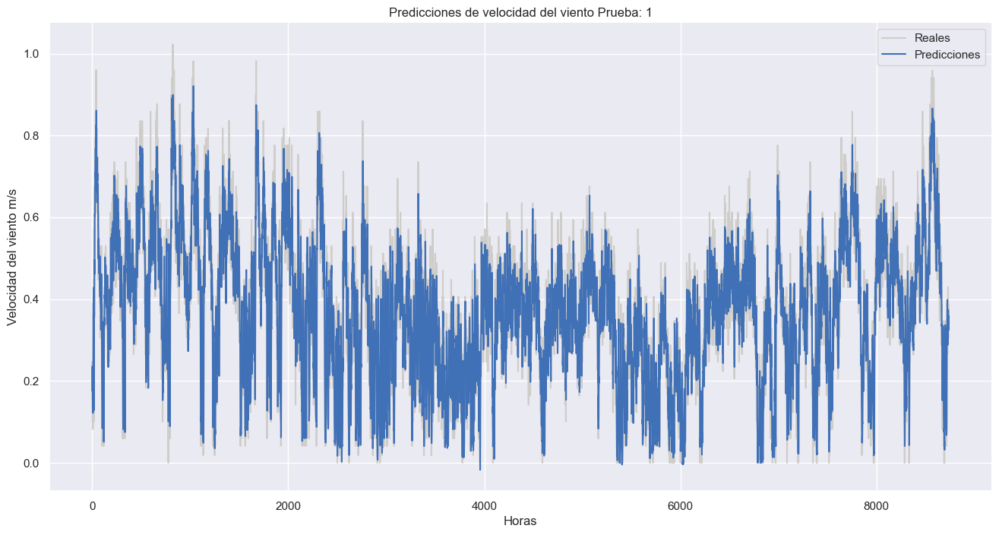

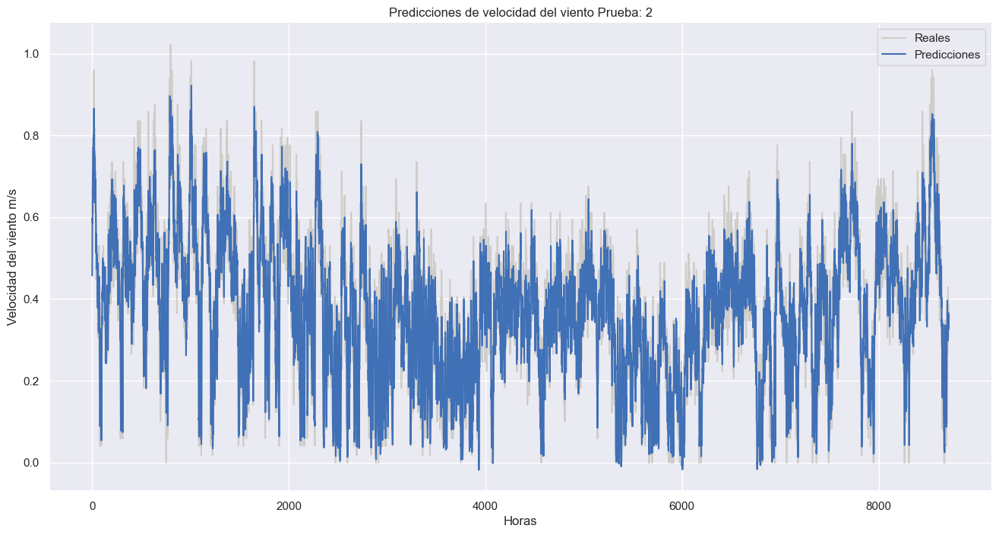

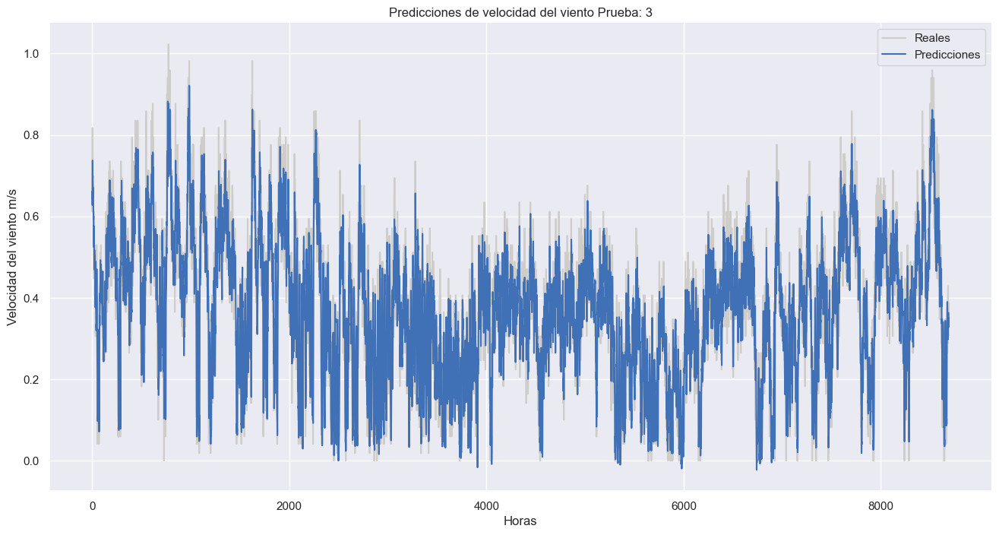

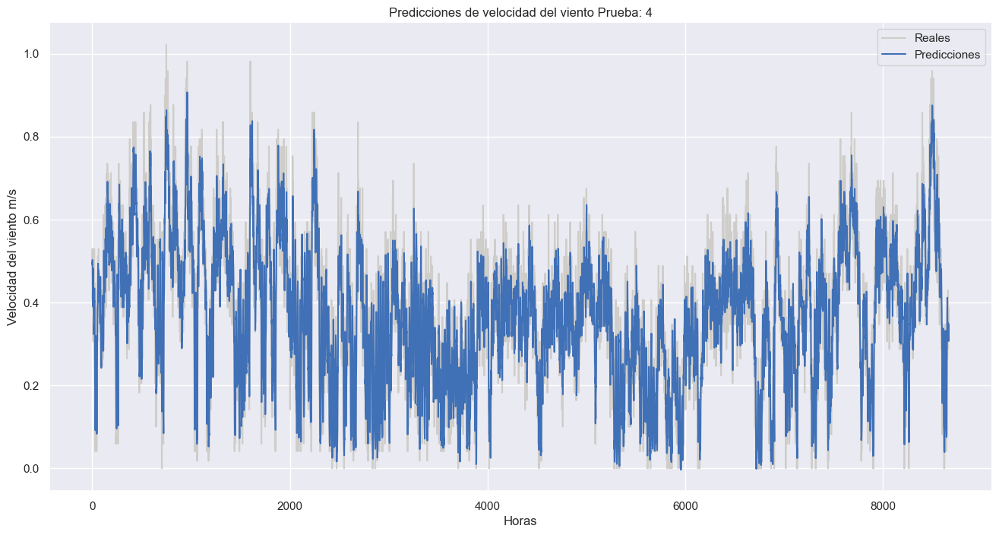

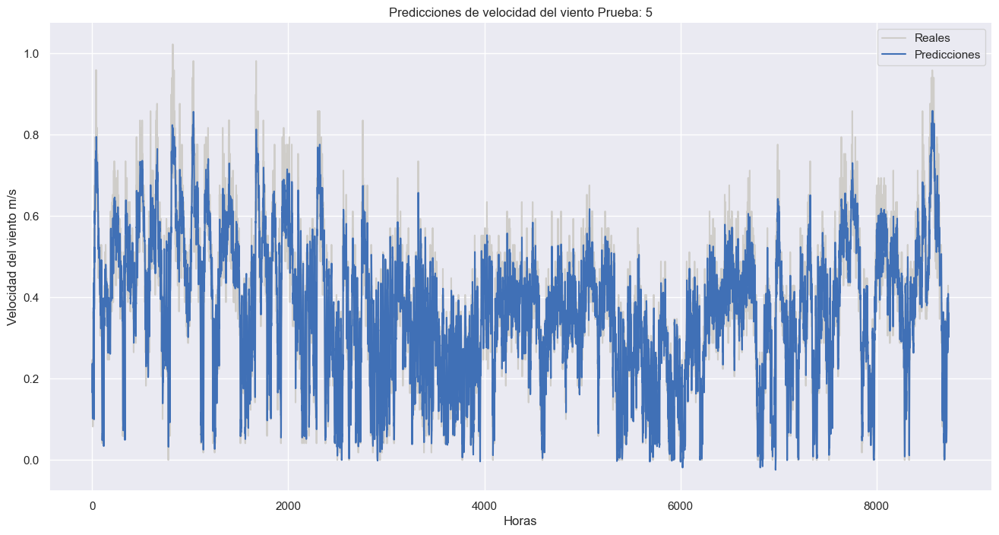

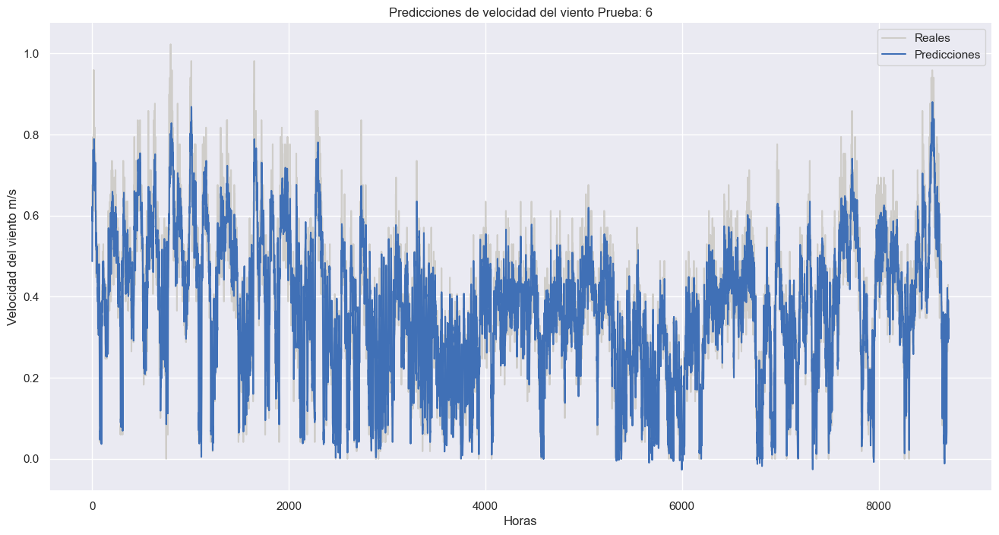

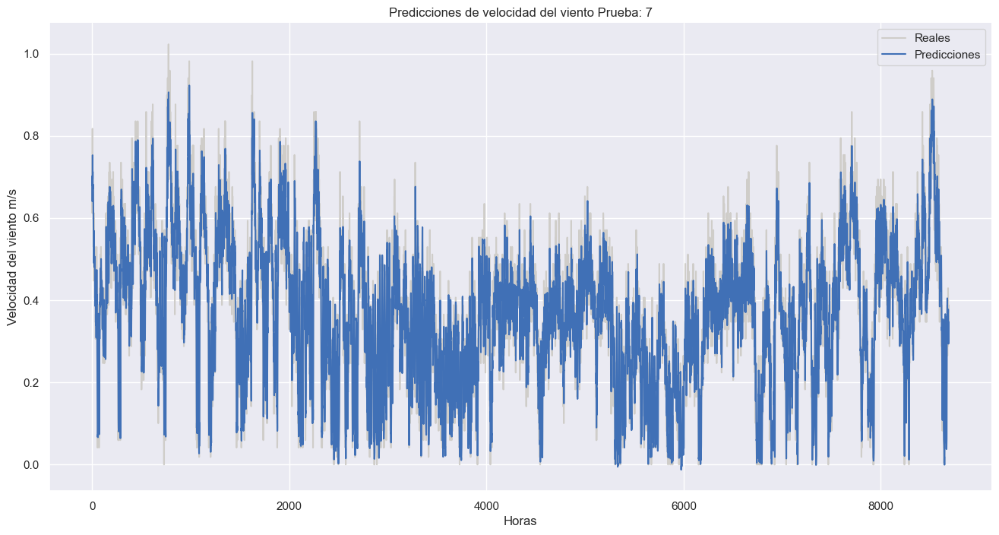

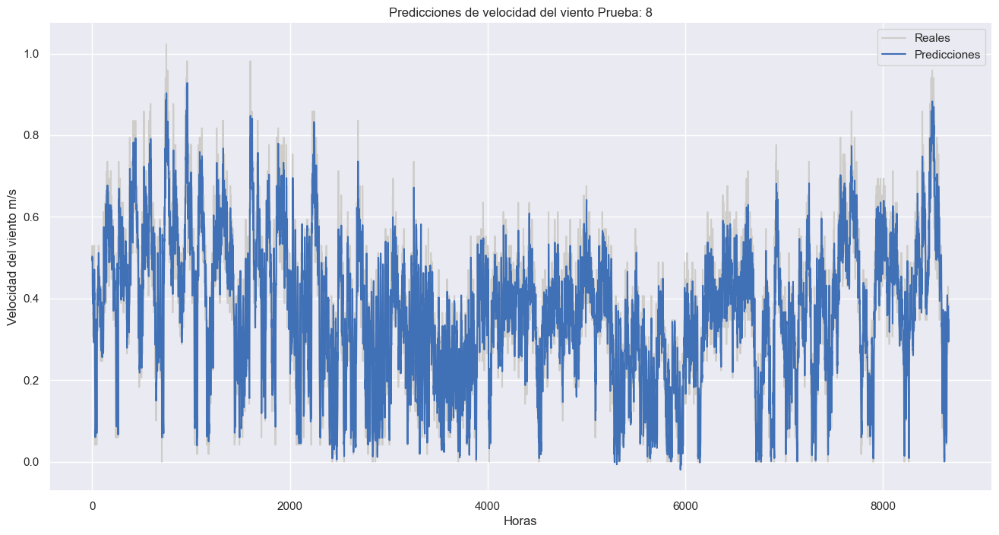

In [77]:
%%time
# Realizacion de todas las combinaciones de los experminetos de entrenamiento (CHECAR BIEN EL CODIGO)
#def run_test(data, window, horizon, shift, scaler, target, model):

tscv = TimeSeriesSplit(n_splits = 4)
minmax_scl = MinMaxScaler()
    
for i, comb in enumerate(list_rect):
    
    df_ = df_Nizanda.copy()
    drop_cols = [col for col in df_Nizanda.columns if col not in comb[0]]
    df_.drop(drop_cols, axis = 1, inplace = True)
    
    
    df_test = df_Prueba.copy()
    drop_cols = [col for col in df_Prueba.columns if col not in comb[0]]
    df_test.drop(drop_cols, axis = 1, inplace = True)
    
    minmax_scl.fit(df_)
    
    print('---Test Experiment: ', str(i + 1) + '---')
    
    #Entrenamiento
    w, n_cols = data_preprocessing(df_, minmax_scl)
    x_train, y_train = make_windows(w, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    #Prueba
    w_test, n_cols = data_preprocessing(df_test, minmax_scl)
    x_test, y_test = make_windows(w_test, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    if len(x_train.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_train.shape
        x_train = x_train.reshape((rows, nx*ny))
        
        rows, nx, ny = x_test.shape
        x_test = x_test.reshape((rows, nx*ny))
        
    
    
    p = ast.literal_eval(model_parameters[i])
    print('---Parametros: ' +  model_parameters[i] + '---')
    model = SVR(C = p['C'][0], epsilon = p['epsilon'][0], gamma = p['gamma'][0], kernel = p['kernel'][0])
    model.fit(x_train, y_train.ravel())
    
    y_pred = model.predict(x_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared= False)
    
    #test_dict, preds = run_test(df_test, window = comb[1], horizon = comb[2], shift = 0, scaler = minmax_scl, model = model)
    
    plot_series(y_test, y_pred, title = 'Predicciones de velocidad del viento ' + 'Prueba: ' + str(i + 1))
    
    df_SVR_test.loc[len(df_SVR_test.index)] = ['SVR', comb[2], r2, rmse, mae, [comb[0], comb[1], comb[2]], p]
print('Runs experiment finished')

In [78]:
df_SVR_test

,Modelo,Horizon,R2,RSME,MAE,Comb,Params
0,SVR,1,0.836669,0.073185,0.055505,"[[Month, Day, Hour, High Wind Speed m/s], 24, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.01],..."
1,SVR,1,0.836716,0.073176,0.055671,"[[Month, Day, Hour, High Wind Speed m/s], 48, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.01],..."
2,SVR,1,0.834673,0.073312,0.055868,"[[Month, Day, Hour, High Wind Speed m/s], 72, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.01],..."
3,SVR,1,0.828885,0.074495,0.056999,"[[Month, Day, Hour, High Wind Speed m/s], 96, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.001]..."
4,SVR,1,0.840405,0.072343,0.054879,"[[High Wind Speed m/s], 24, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.1], ..."
5,SVR,1,0.841713,0.072047,0.054915,"[[High Wind Speed m/s], 48, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.1], ..."
6,SVR,1,0.836831,0.072832,0.055527,"[[High Wind Speed m/s], 72, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.01],..."
7,SVR,1,0.836374,0.072847,0.055432,"[[High Wind Speed m/s], 96, 1]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.01],..."


### Experimento Prueba MIMO

#### Prueba

In [46]:
df_svr_mimo = pd.read_csv('./Resultados/SVR_MIMO.csv')
df_svr_mimo['Params']
model_parameters = df_svr_mimo['Params']

In [44]:
list_mimo = list_mimo

---Test Experiment:  1---
---Parametros: {'C': [1], 'epsilon': [0.1], 'gamma': [0.01], 'kernel': ['rbf']}---
---Test Experiment:  2---
---Parametros: {'C': [1], 'epsilon': [0.1], 'gamma': [0.01], 'kernel': ['rbf']}---
---Test Experiment:  3---
---Parametros: {'C': [1], 'epsilon': [0.1], 'gamma': [0.01], 'kernel': ['rbf']}---
---Test Experiment:  4---
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.001], 'kernel': ['rbf']}---
---Test Experiment:  5---
---Parametros: {'C': [100], 'epsilon': [0.001], 'gamma': [0.1], 'kernel': ['rbf']}---
---Test Experiment:  6---
---Parametros: {'C': [10], 'epsilon': [0.001], 'gamma': [0.1], 'kernel': ['rbf']}---
---Test Experiment:  7---
---Parametros: {'C': [1], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}---
---Test Experiment:  8---
---Parametros: {'C': [1], 'epsilon': [0.1], 'gamma': [0.1], 'kernel': ['rbf']}---
Runs experiment finished
Wall time: 24min 18s


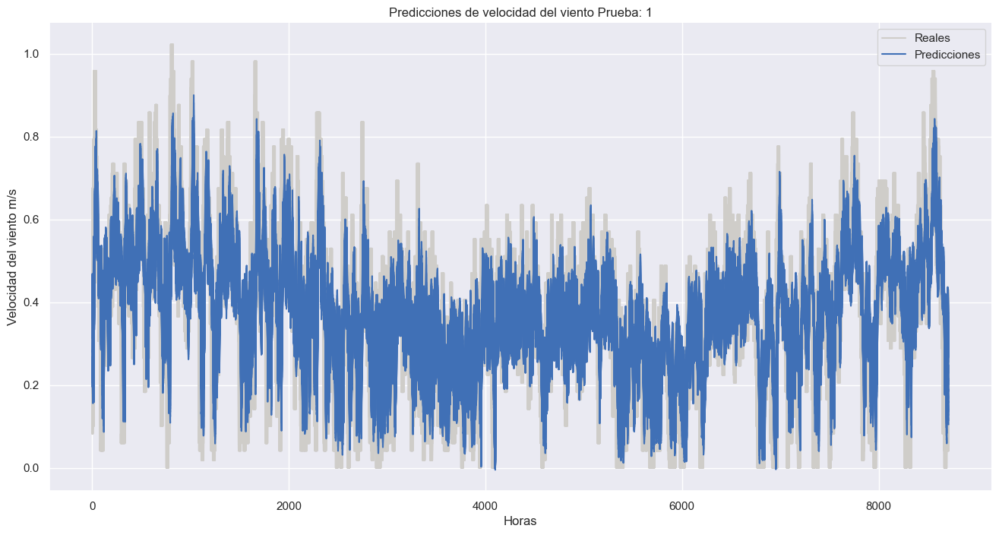

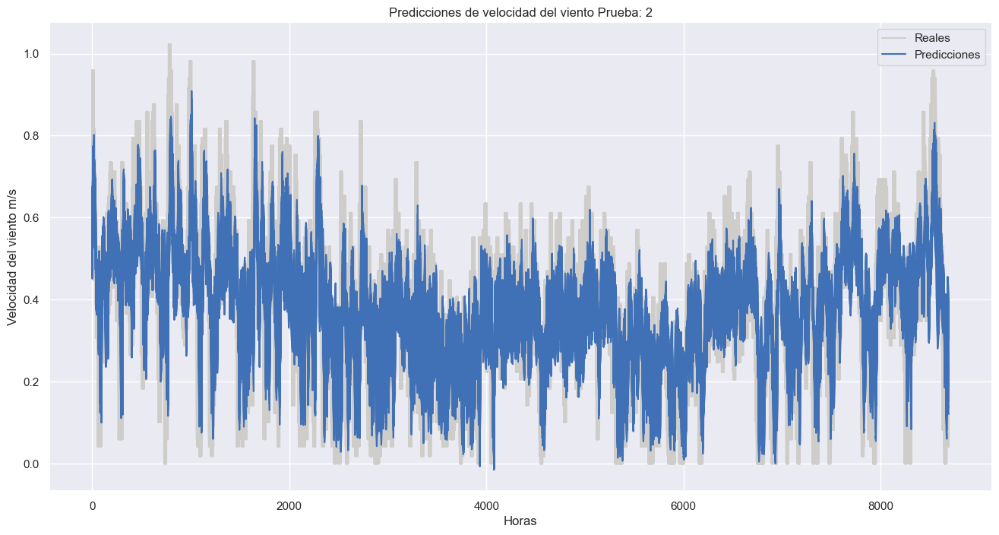

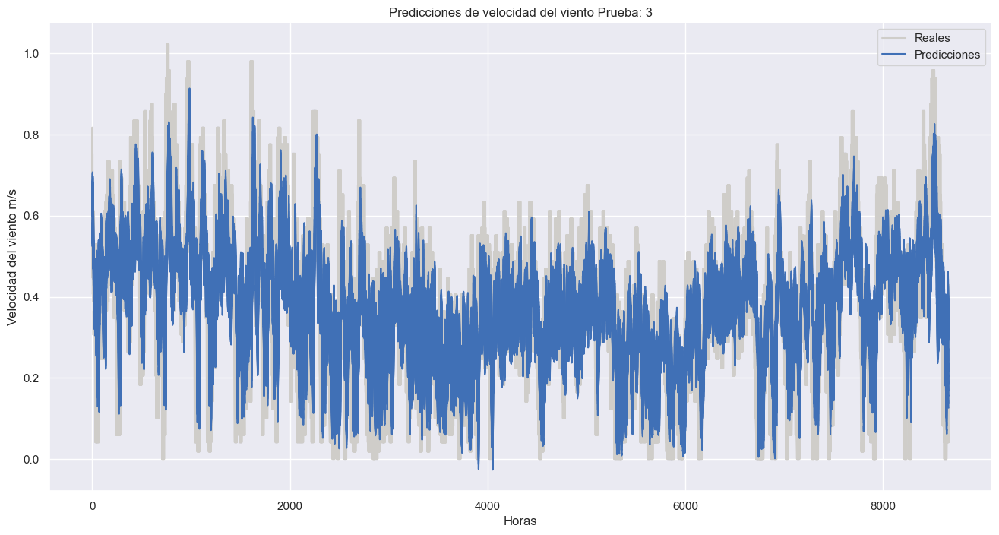

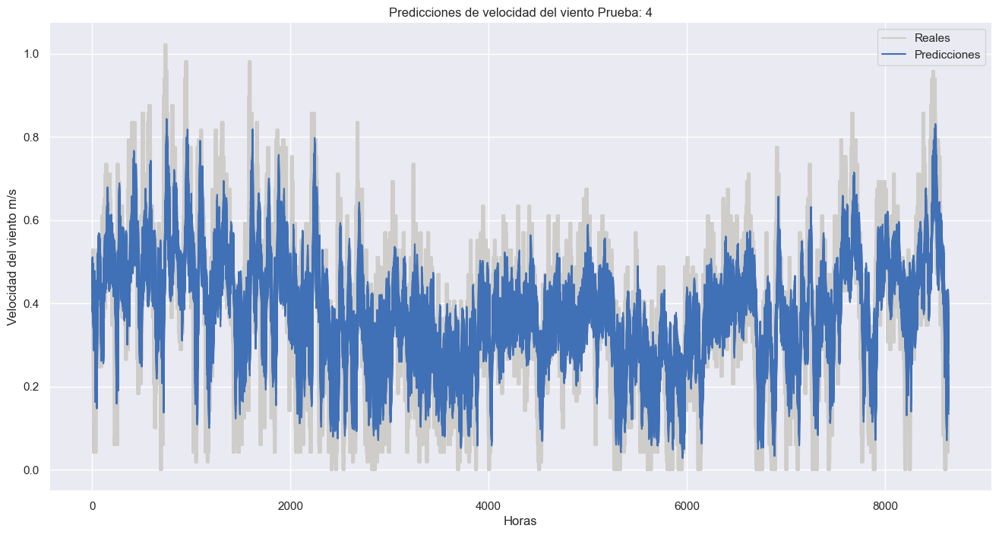

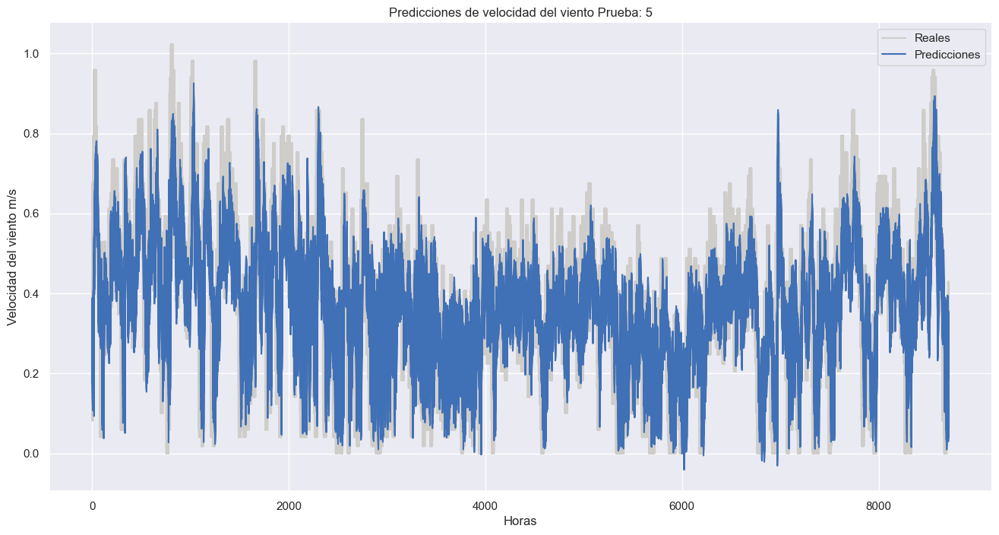

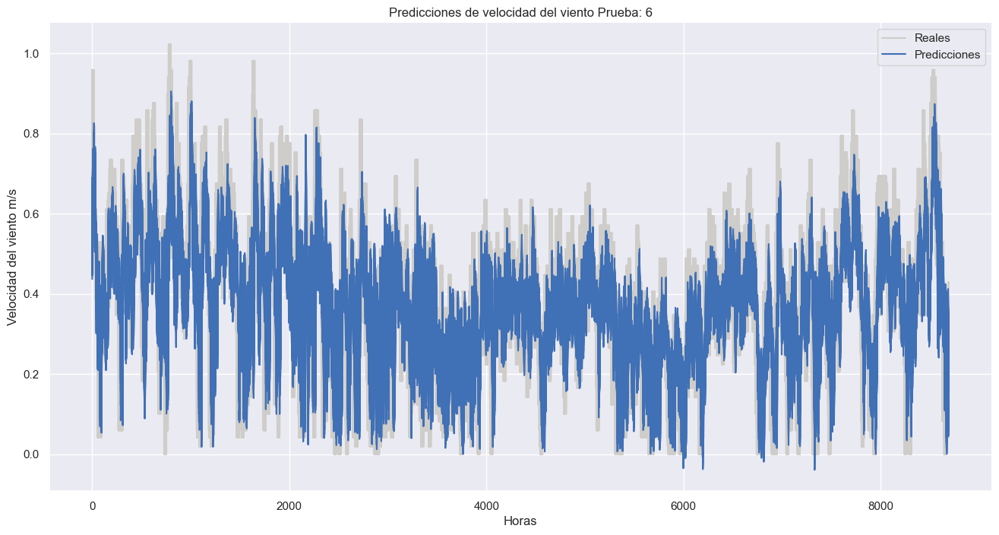

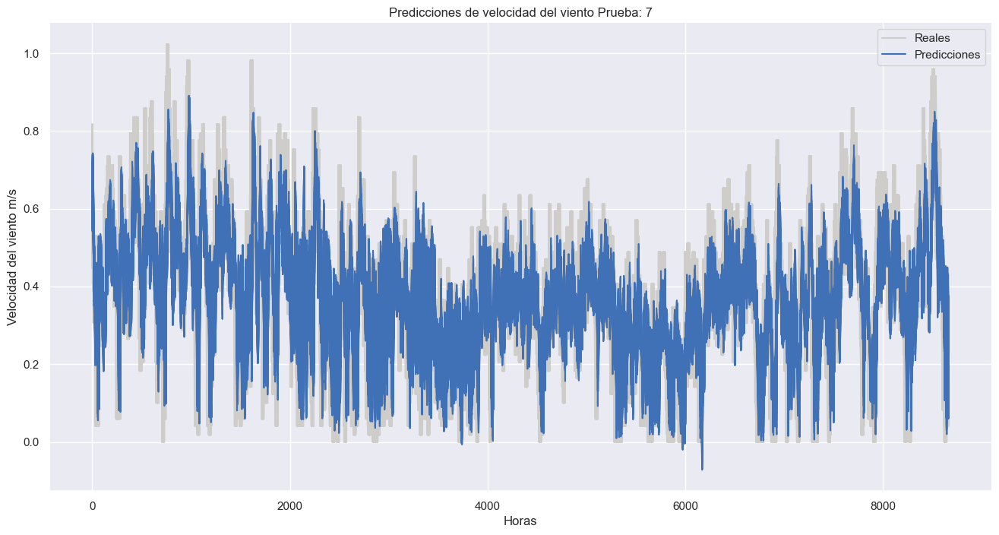

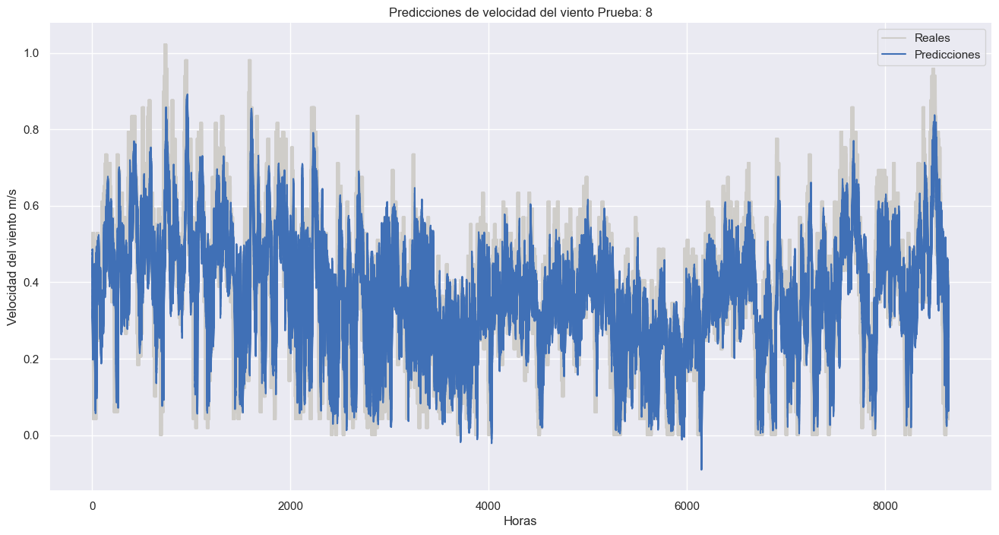

In [52]:
%%time
# Realizacion de todas las combinaciones de los experminetos de entrenamiento (CHECAR BIEN EL CODIGO)
#def run_test(data, window, horizon, shift, scaler, target, model):

tscv = TimeSeriesSplit(n_splits = 4)
minmax_scl = MinMaxScaler()
    
for i, comb in enumerate(list_mimo):
    
    df_ = df_Nizanda.copy()
    drop_cols = [col for col in df_Nizanda.columns if col not in comb[0]]
    df_.drop(drop_cols, axis = 1, inplace = True)
    
    
    df_test = df_Prueba.copy()
    drop_cols = [col for col in df_Prueba.columns if col not in comb[0]]
    df_test.drop(drop_cols, axis = 1, inplace = True)
    
    minmax_scl.fit(df_)
    
    print('---Test Experiment: ', str(i + 1) + '---')
    
    #Entrenamiento
    w, n_cols = data_preprocessing(df_, minmax_scl)
    x_train, y_train = make_windows(w, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    #Prueba
    w_test, n_cols = data_preprocessing(df_test, minmax_scl)
    x_test, y_test = make_windows(w_test, input_size = comb[1], horizon = comb[2], shift = 0,  n_cols = n_cols)
    
    
    if len(x_train.shape) > 2:
        # Convertir a arreglo de 2 dimensiones
        rows, nx, ny = x_train.shape
        x_train = x_train.reshape((rows, nx*ny))
        
        rows, nx, ny = x_test.shape
        x_test = x_test.reshape((rows, nx*ny))
        
    
    
    p = ast.literal_eval(model_parameters[i])
    print('---Parametros: ' +  model_parameters[i] + '---')
    model = MSVR(params = p)#SVR(C = p['C'][0], epsilon = p['epsilon'][0], gamma = p['gamma'][0], kernel = p['kernel'][0])
    model.fit(x_train, y_train)
    
    y_pred = model.predict(x_test)
    
    r2_s = r2(y_test, y_pred)
    mae_s = mae(y_test, y_pred)
    rmse_s = rmse(y_test, y_pred)
    
    #test_dict, preds = run_test(df_test, window = comb[1], horizon = comb[2], shift = 0, scaler = minmax_scl, model = model)
    
    plot_series(y_test, y_pred, title = 'Predicciones de velocidad del viento ' + 'Prueba: ' + str(i + 1))
    
    df_SVR_mimo_test.loc[len(df_SVR_mimo_test.index)] = ['M-SVR', comb[2], r2_s, rmse_s, mae_s, [comb[0], comb[1], comb[2]], p]
print('Runs experiment finished')

In [53]:
df_SVR_mimo_test

,Modelo,Horizon,R2,RMSE,MAE,Comb,Params
0,M-SVR,24,0.588645,0.116144,0.091227,"[[Month, Day, Hour, High Wind Speed m/s], 24, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.01], ..."
1,M-SVR,24,0.586051,0.116511,0.091613,"[[Month, Day, Hour, High Wind Speed m/s], 48, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.01], ..."
2,M-SVR,24,0.574655,0.117591,0.092292,"[[Month, Day, Hour, High Wind Speed m/s], 72, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.01], ..."
3,M-SVR,24,0.547578,0.121131,0.094793,"[[Month, Day, Hour, High Wind Speed m/s], 96, 24]","{'C': [1], 'epsilon': [0.01], 'gamma': [0.001]..."
4,M-SVR,24,0.598187,0.114789,0.090213,"[[High Wind Speed m/s], 24, 24]","{'C': [100], 'epsilon': [0.001], 'gamma': [0.1..."
5,M-SVR,24,0.600736,0.114426,0.089735,"[[High Wind Speed m/s], 48, 24]","{'C': [10], 'epsilon': [0.001], 'gamma': [0.1]..."
6,M-SVR,24,0.589040,0.115586,0.090286,"[[High Wind Speed m/s], 72, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.1], '..."
7,M-SVR,24,0.579903,0.116724,0.090842,"[[High Wind Speed m/s], 96, 24]","{'C': [1], 'epsilon': [0.1], 'gamma': [0.1], '..."


### Experimento Simulacion

In [19]:
P_Enero = df_Prueba[df_Prueba['Month'] == 1]
P_Febrero = df_Prueba[df_Prueba['Month'] == 2]
P_Marzo = df_Prueba[df_Prueba['Month'] == 3]
P_Abril = df_Prueba[df_Prueba['Month'] == 4]
P_Mayo = df_Prueba[df_Prueba['Month'] == 5]
P_Junio = df_Prueba[df_Prueba['Month'] == 6]
P_Julio = df_Prueba[df_Prueba['Month'] == 7]
P_Agosto = df_Prueba[df_Prueba['Month'] == 8]
P_Septiembre = df_Prueba[df_Prueba['Month'] == 9]
P_Octubre = df_Prueba[df_Prueba['Month'] == 10]
P_Noviembre = df_Prueba[df_Prueba['Month'] == 11]
P_Diciembre = df_Prueba[df_Prueba['Month'] == 12]

Meses = {
    'Enero': P_Enero, 'Febrero': P_Febrero,
    'Marzo': P_Marzo, 'Abril': P_Abril,
    'Mayo': P_Mayo, 'Junio': P_Junio,
    'Julio': P_Julio, 'Agosto': P_Agosto, 
    'Septiembre': P_Septiembre, 'Octubre': P_Octubre, 
    'Novimebre': P_Noviembre, 'Diciembre': P_Diciembre
    }
keys = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Novimebre', 'Diciembre']

In [20]:
sns.set(rc={'figure.figsize':(14,5)})

#### Simulacion de todos los meses (Recursivo)

In [37]:
import warnings
warnings.filterwarnings('ignore')

combi = list_rect[5]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5
#else:
    #inicio = -1

model_parameters = df_svr_rec['Params']

minmax_scl = MinMaxScaler()

df_ = df_Nizanda.copy()
drop_cols = [col for col in df_Nizanda.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    


p = ast.literal_eval(model_parameters[5])
#print(p['C'])
print('---Parametros: ' +  str(model_parameters[5]) + ' ---')
model = SVR(C = p['C'][0], epsilon = p['epsilon'][0], gamma = p['gamma'][0], kernel = p['kernel'][0])
model.fit(x_train, y_train.ravel())


for i, mes in enumerate(keys):
    df_mes = Meses[keys[i]]
    for j in range(inicio, len(df_mes['Day'].unique()) + 1):
        #Simulacion
        print(str(i + 1) + ' : ' + str(j))
        m, p, c, pred = simulation_v2(combi, (i + 1), j, model, minmax_scl)
        # Metricas
        r2 = r2_score(c, pred)
        mae = mean_absolute_error(c, pred)
        rmse = mean_squared_error(c, pred, squared= False)
        
        #Insertandolos en el Dataframe
        df_SVR_sim.loc[len(df_SVR_sim.index)] = [mes, j, r2, rmse, mae, 'SVR', 'REC', combi, p]

(['High Wind Speed m/s'], 48, 1)
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.1], 'kernel': ['rbf']} ---
1 : 3
1 : 4
1 : 5
1 : 6
1 : 7
1 : 8
1 : 9
1 : 10
1 : 11
1 : 12
1 : 13
1 : 14
1 : 15
1 : 16
1 : 17
1 : 18
1 : 19
1 : 20
1 : 21
1 : 22
1 : 23
1 : 24
1 : 25
1 : 26
1 : 27
1 : 28
1 : 29
1 : 30
1 : 31
2 : 3
2 : 4
2 : 5
2 : 6
2 : 7
2 : 8
2 : 9
2 : 10
2 : 11
2 : 12
2 : 13
2 : 14
2 : 15
2 : 16
2 : 17
2 : 18
2 : 19
2 : 20
2 : 21
2 : 22
2 : 23
2 : 24
2 : 25
2 : 26
2 : 27
2 : 28
3 : 3
3 : 4
3 : 5
3 : 6
3 : 7
3 : 8
3 : 9
3 : 10
3 : 11
3 : 12
3 : 13
3 : 14
3 : 15
3 : 16
3 : 17
3 : 18
3 : 19
3 : 20
3 : 21
3 : 22
3 : 23
3 : 24
3 : 25
3 : 26
3 : 27
3 : 28
3 : 29
3 : 30
3 : 31
4 : 3
4 : 4
4 : 5
4 : 6
4 : 7
4 : 8
4 : 9
4 : 10
4 : 11
4 : 12
4 : 13
4 : 14
4 : 15
4 : 16
4 : 17
4 : 18
4 : 19
4 : 20
4 : 21
4 : 22
4 : 23
4 : 24
4 : 25
4 : 26
4 : 27
4 : 28
4 : 29
4 : 30
5 : 3
5 : 4
5 : 5
5 : 6
5 : 7
5 : 8
5 : 9
5 : 10
5 : 11
5 : 12
5 : 13
5 : 14
5 : 15
5 : 16
5 : 17
5 : 18
5 : 19
5 : 20
5 : 21
5

In [40]:
df_SVR_sim_rec = df_SVR_sim[df_SVR_sim['Metodo'] == 'REC']

<AxesSubplot: xlabel='Mes', ylabel='R2'>

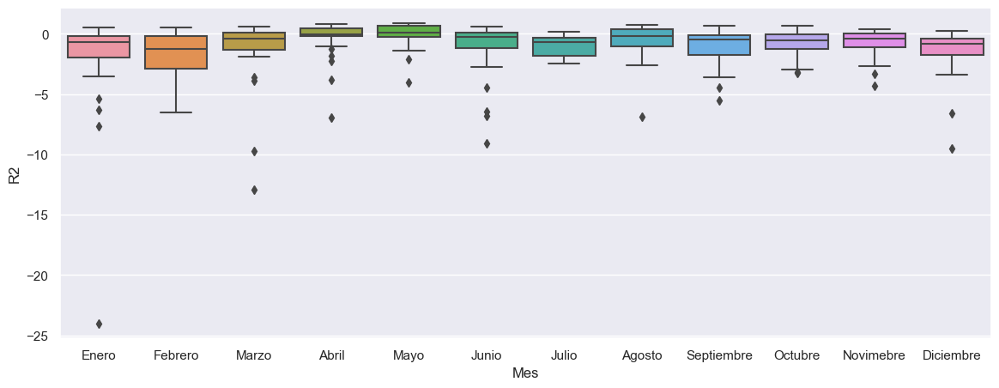

In [41]:
sns.boxplot(data = df_SVR_sim_rec, x = 'Mes', y = 'R2')

<AxesSubplot: xlabel='Mes', ylabel='RMSE'>

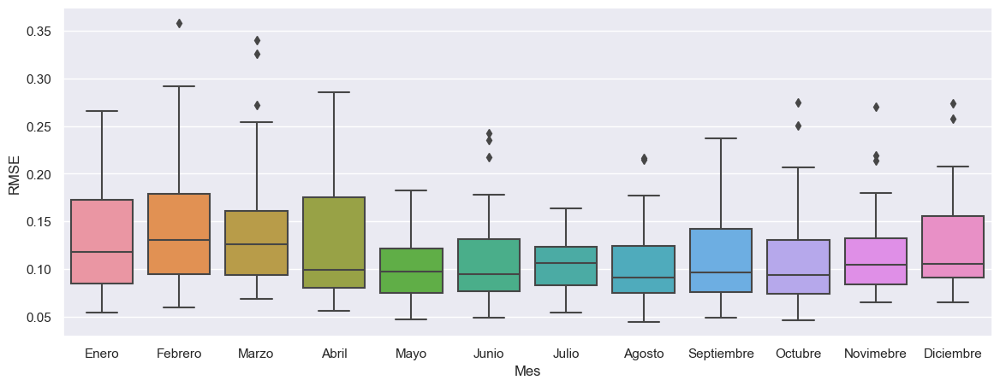

In [42]:
sns.boxplot(data = df_SVR_sim_rec, x = 'Mes', y = 'RMSE')

<AxesSubplot: xlabel='Mes', ylabel='MAE'>

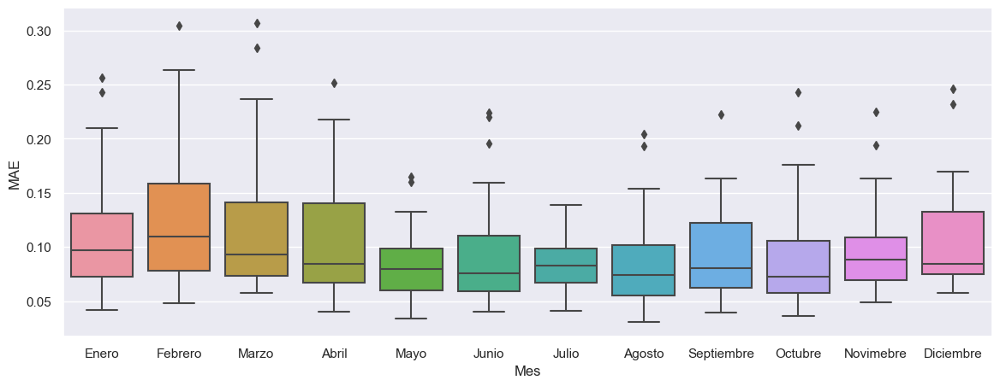

In [43]:
sns.boxplot(data = df_SVR_sim_rec, x = 'Mes', y = 'MAE')

In [44]:
df_SVR_sim_rec.to_csv(r'C:\Users\Angel\Documents\Tesis\Notebooks\Resultados\SVR_sim_rec.csv')

#### Simulacion de todos los meses (MIMO)

In [52]:
import warnings
warnings.filterwarnings('ignore')

combi = list_mimo[5]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5
#else:
    #inicio = -1

model_parameters = df_svr_mimo['Params']
minmax_scl = MinMaxScaler()

df_ = df_Nizanda.copy()
drop_cols = [col for col in df_Nizanda.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    


p = ast.literal_eval(model_parameters[5])
print('---Parametros: ' +  str(p) + '---')
Model = MSVR(params = p)
Model.fit(x_train, y_train)


for i, mes in enumerate(keys):
    df_mes = Meses[keys[i]]
    for j in range(inicio, len(df_mes['Day'].unique()) + 1):
        #Simulacion
        print(str(i + 1) + ' : ' + str(j))
        m, p, c, pred = simulation_v2(combi, (i + 1), j, Model, minmax_scl)
        # Metricas
        r2 = r2_score(c, pred)
        mae = mean_absolute_error(c, pred)
        rmse = mean_squared_error(c, pred, squared= False)
        
        #Insertandolos en el Dataframe
        df_SVR_sim.loc[len(df_SVR_sim.index)] = [mes, j, r2, rmse, mae, 'M-SVR', 'MIMO', combi, p]

(['High Wind Speed m/s'], 48, 24)
---Parametros: {'C': [10], 'epsilon': [0.001], 'gamma': [0.1], 'kernel': ['rbf']}---
1 : 3
1 : 4
1 : 5
1 : 6
1 : 7
1 : 8
1 : 9
1 : 10
1 : 11
1 : 12
1 : 13
1 : 14
1 : 15
1 : 16
1 : 17
1 : 18
1 : 19
1 : 20
1 : 21
1 : 22
1 : 23
1 : 24
1 : 25
1 : 26
1 : 27
1 : 28
1 : 29
1 : 30
1 : 31
2 : 3
2 : 4
2 : 5
2 : 6
2 : 7
2 : 8
2 : 9
2 : 10
2 : 11
2 : 12
2 : 13
2 : 14
2 : 15
2 : 16
2 : 17
2 : 18
2 : 19
2 : 20
2 : 21
2 : 22
2 : 23
2 : 24
2 : 25
2 : 26
2 : 27
2 : 28
3 : 3
3 : 4
3 : 5
3 : 6
3 : 7
3 : 8
3 : 9
3 : 10
3 : 11
3 : 12
3 : 13
3 : 14
3 : 15
3 : 16
3 : 17
3 : 18
3 : 19
3 : 20
3 : 21
3 : 22
3 : 23
3 : 24
3 : 25
3 : 26
3 : 27
3 : 28
3 : 29
3 : 30
3 : 31
4 : 3
4 : 4
4 : 5
4 : 6
4 : 7
4 : 8
4 : 9
4 : 10
4 : 11
4 : 12
4 : 13
4 : 14
4 : 15
4 : 16
4 : 17
4 : 18
4 : 19
4 : 20
4 : 21
4 : 22
4 : 23
4 : 24
4 : 25
4 : 26
4 : 27
4 : 28
4 : 29
4 : 30
5 : 3
5 : 4
5 : 5
5 : 6
5 : 7
5 : 8
5 : 9
5 : 10
5 : 11
5 : 12
5 : 13
5 : 14
5 : 15
5 : 16
5 : 17
5 : 18
5 : 19
5 : 20
5 : 21

In [53]:
df_SVR_sim_MIMO = df_SVR_sim[df_SVR_sim['Metodo'] == 'MIMO']

<AxesSubplot: xlabel='Mes', ylabel='R2'>

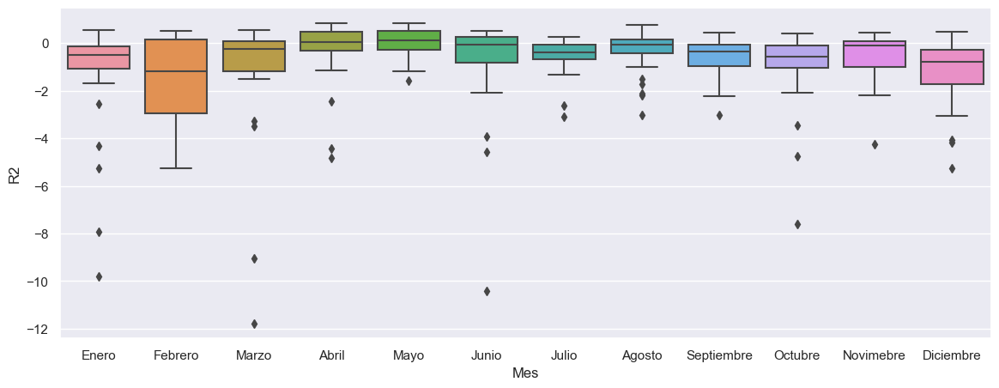

In [57]:
sns.boxplot(data = df_SVR_sim_MIMO, x = 'Mes', y = 'R2')

<AxesSubplot: xlabel='Mes', ylabel='RMSE'>

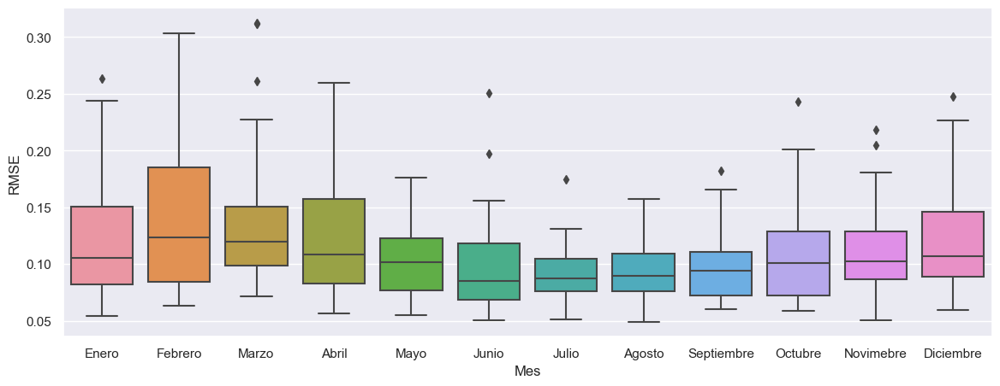

In [58]:
sns.boxplot(data = df_SVR_sim_MIMO, x = 'Mes', y = 'RMSE')

<AxesSubplot: xlabel='Mes', ylabel='MAE'>

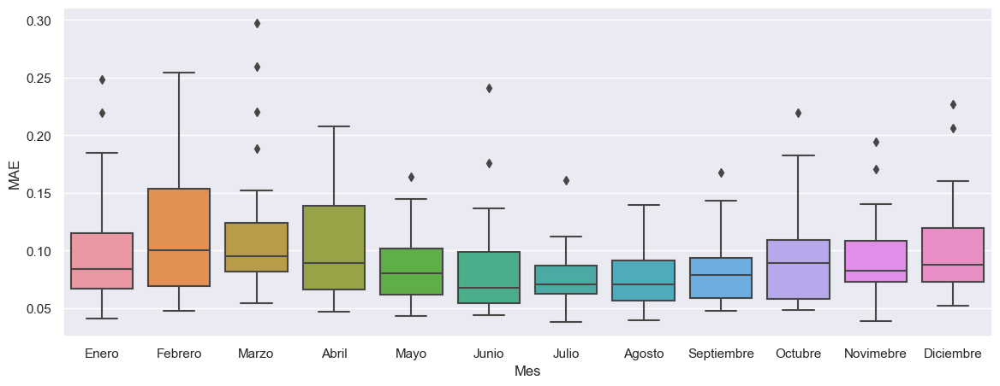

In [59]:
sns.boxplot(data = df_SVR_sim_MIMO, x = 'Mes', y = 'MAE')

In [60]:
df_SVR_sim_MIMO.to_csv(r'C:\Users\Angel\Documents\Tesis\Notebooks\Resultados\SVR_sim_MIMO.csv')

In [37]:
print('Configuracon: ' + str(combi))
m, p, c, pred_r = simulation(combi_rec, 1, 31, model, minmax_scl)

Configuracon: (['High Wind Speed m/s'], 48, 1)


###### Graficacion Enero 31 (REC)

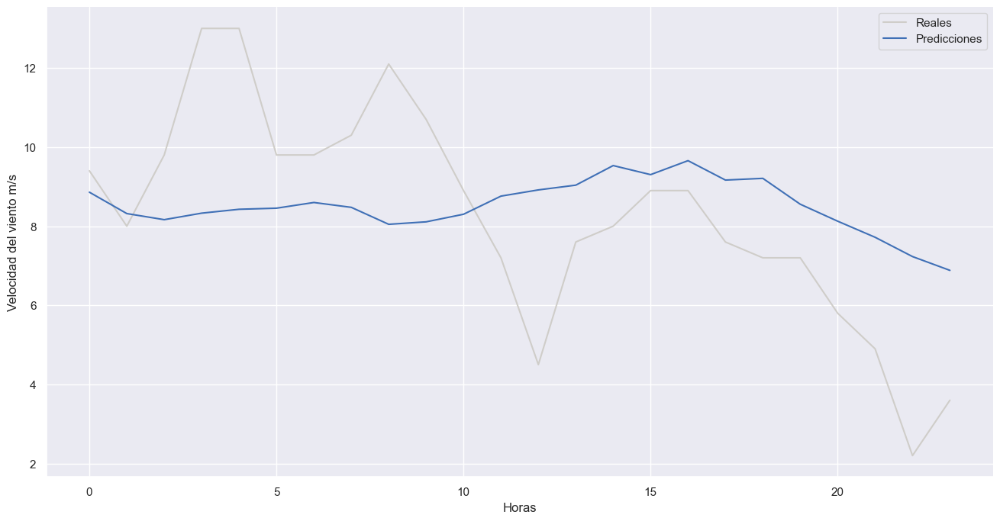

In [38]:
plot_series(c['High Wind Speed m/s'].values, pred_r, title = '')

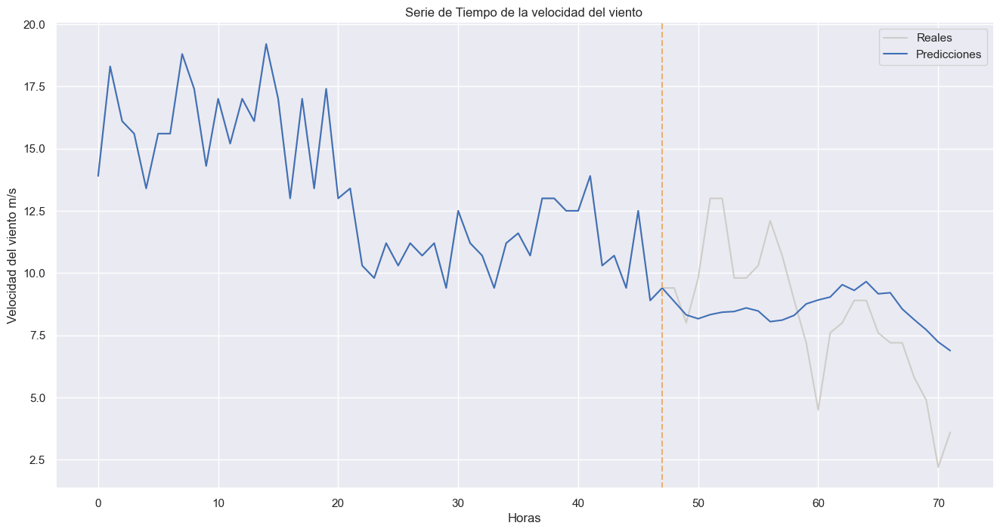

In [39]:
w_inv = np.hstack([p, pred_r])
w_inv
plot_series(m['High Wind Speed m/s'].values, w_inv, vline = True)

###### Resultados Enero 31 (REC)

In [40]:
r2 = r2_score(c['High Wind Speed m/s'].values, pred_r)
mae = mean_absolute_error(c['High Wind Speed m/s'].values, pred_r)
rmse = mean_squared_error(c['High Wind Speed m/s'].values, pred_r, squared= False)

print('Resultados: ' + 'r2: ' + str(r2) + 'mae: ' + str(mae) + 'rmse: ' + str(rmse))

Resultados: r2: 0.07480063370102907mae: 2.160278519493571rmse: 2.587936516359832


##### Simulacion MIMO

In [ ]:
combi_mimo = list_mimo[0]

df_SVR_mimo_test['Params']
model_parameters = df_SVR_mimo_test['Params']
minmax_scl = MinMaxScaler()
df_ = df_Nizanda.copy()
drop_cols = [col for col in df_Nizanda.columns if col not in combi_mimo[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi_mimo[1], horizon = combi_mimo[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))

p = model_parameters[0]
print('---Parametros: ' +  str(model_parameters[0]) + '---')
model = MSVR(params = p)
model.fit(x_train, y_train)

In [59]:
print('Configuracon: ' + str(combi_mimo))
m, p, c, pred_m = simulation(combi_mimo, 1, 31, model, minmax_scl)

Configuracon: (['Month', 'Day', 'Hour', 'High Wind Speed m/s'], 24, 24)


###### Graficacion Enero 31 (MIMO)

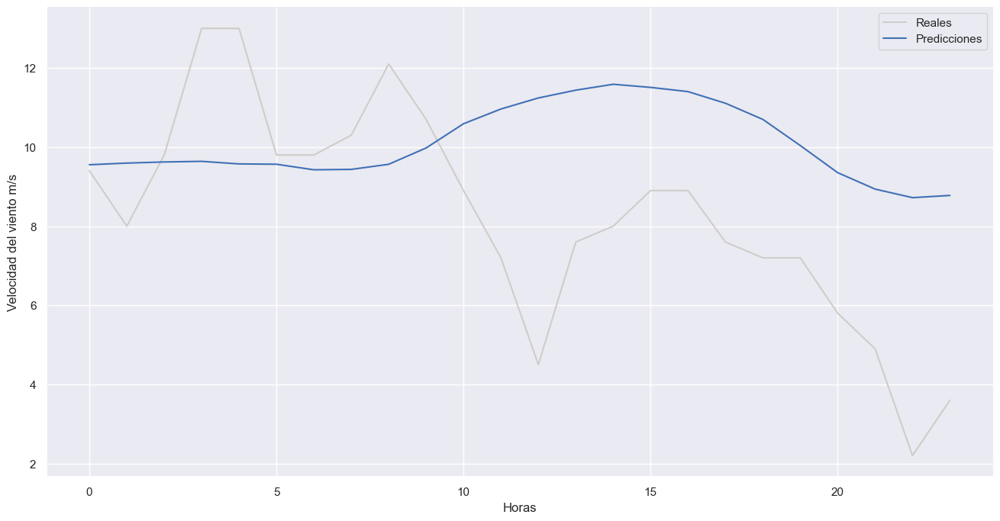

In [60]:
plot_series(c['High Wind Speed m/s'].values, pred_m, title = '')

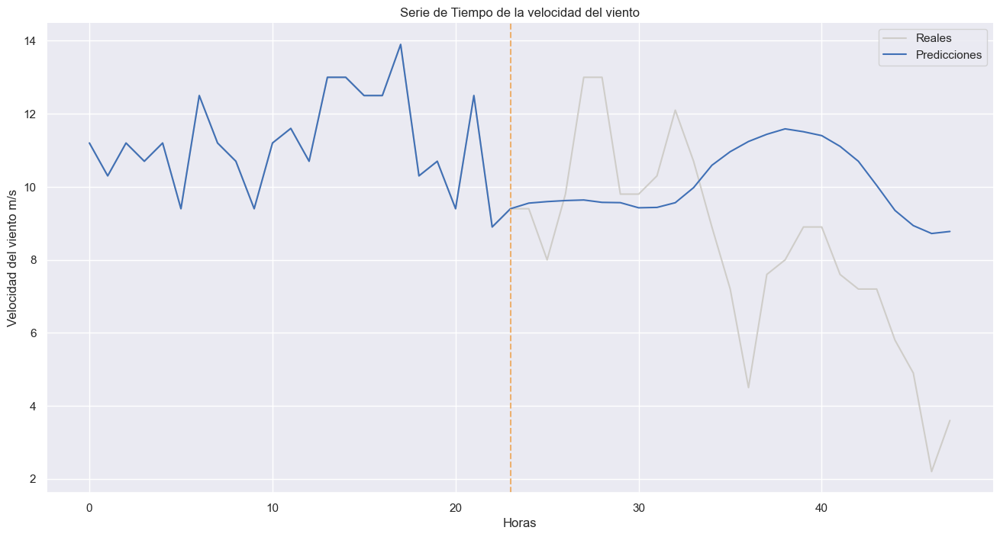

In [61]:
w_inv = np.hstack([p, pred_m])
w_inv
plot_series(m['High Wind Speed m/s'].values, w_inv, vline = True)

###### Resultados Enero 31 (MIMO)

In [62]:
r2 = r2_score(c['High Wind Speed m/s'].values, pred_m)
mae = mean_absolute_error(c['High Wind Speed m/s'].values, pred_m)
rmse = mean_squared_error(c['High Wind Speed m/s'].values, pred_m, squared= False)

print('Resultados: ' + 'r2: ' + str(r2) + 'mae: ' + str(mae) + 'rmse: ' + str(rmse))

Resultados: r2: -0.5399586247056194mae: 2.804626372703787rmse: 3.338800589692371


##### Simulacion Recursividad

In [ ]:
print('Configuracon: ' + str(combi))
m, p, c, pred_r = simulation(combi_rec, 6, 12, model, minmax_scl)

###### Graficacion Junio 12 (REC)

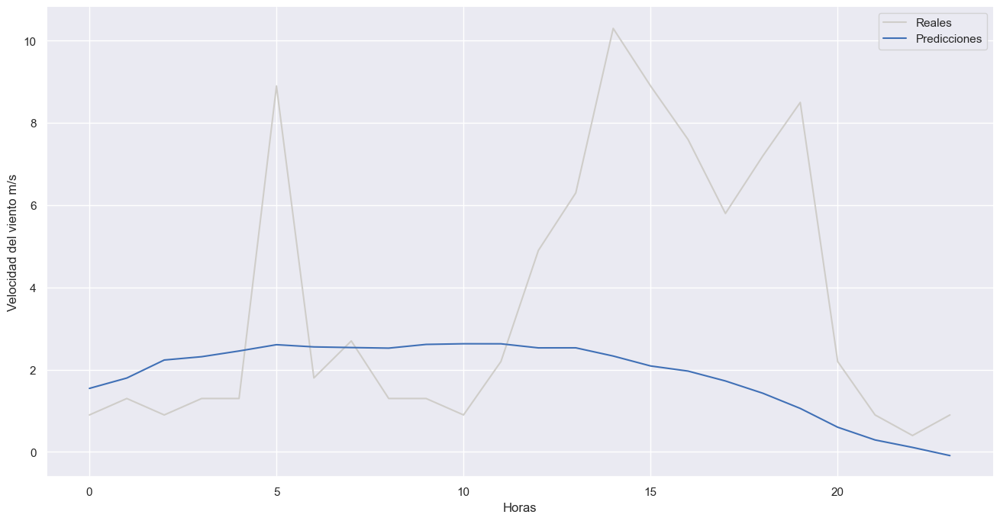

In [42]:
plot_series(c['High Wind Speed m/s'].values, pred_r, title = '')

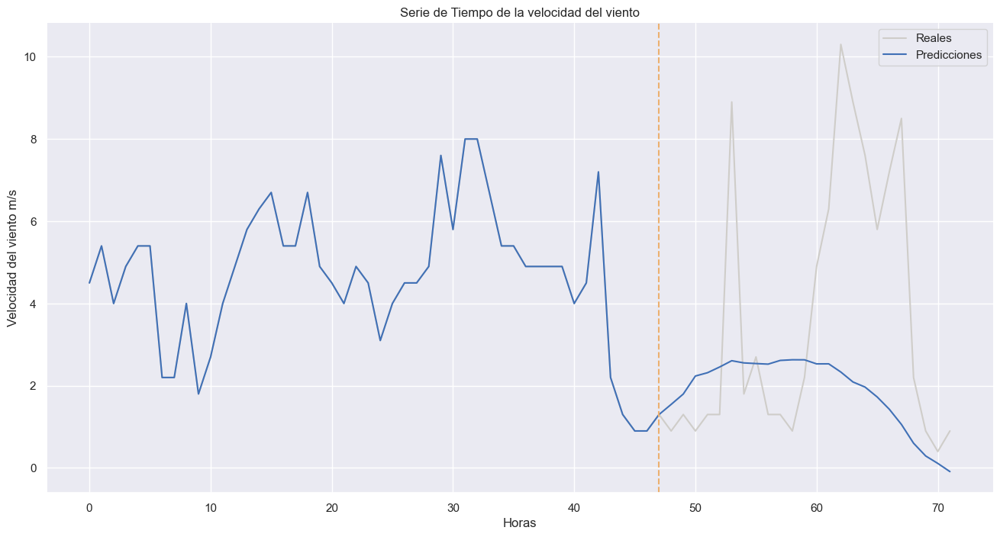

In [43]:
w_inv = np.hstack([p, pred_r])
w_inv
plot_series(m['High Wind Speed m/s'].values, w_inv, vline = True)

###### Resultados Junio 12 (REC)

In [44]:
r2 = r2_score(c['High Wind Speed m/s'].values, pred_r)
mae = mean_absolute_error(c['High Wind Speed m/s'].values, pred_r)
rmse = mean_squared_error(c['High Wind Speed m/s'].values, pred_r, squared= False)

print('Resultados: ' + 'r2: ' + str(r2) + 'mae: ' + str(mae) + 'rmse: ' + str(rmse))

Resultados: r2: -0.29464902593510756mae: 2.661492827964435rmse: 3.6631236998192764


##### Simulacion MIMO

In [72]:
print('Configuracon: ' + str(combi_mimo))
m, p, c, pred_m = simulation(combi_mimo, 6, 12, model, minmax_scl)

Configuracon: (['Month', 'Day', 'Hour', 'High Wind Speed m/s'], 24, 24)


###### Graficacion Junio 12 (MIMO)

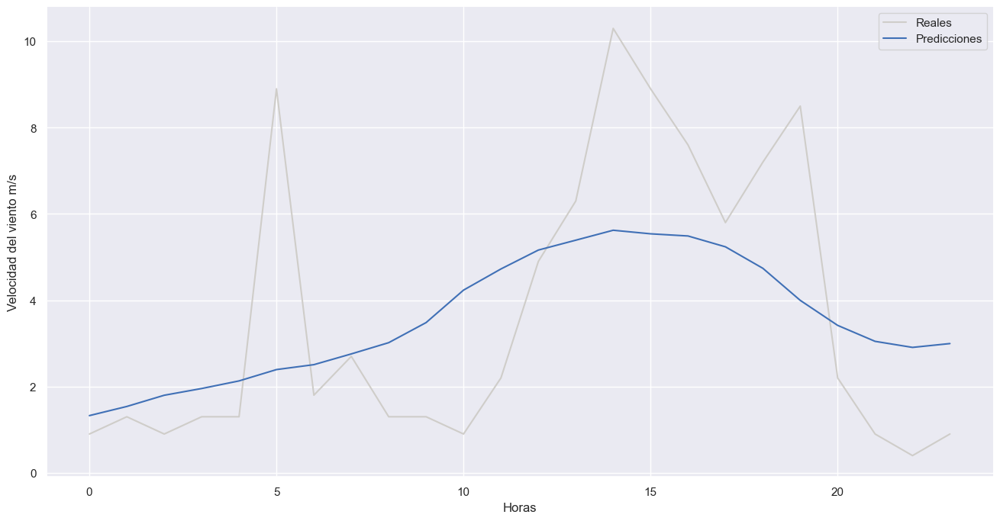

In [73]:
plot_series(c['High Wind Speed m/s'].values, pred_m, title = '')

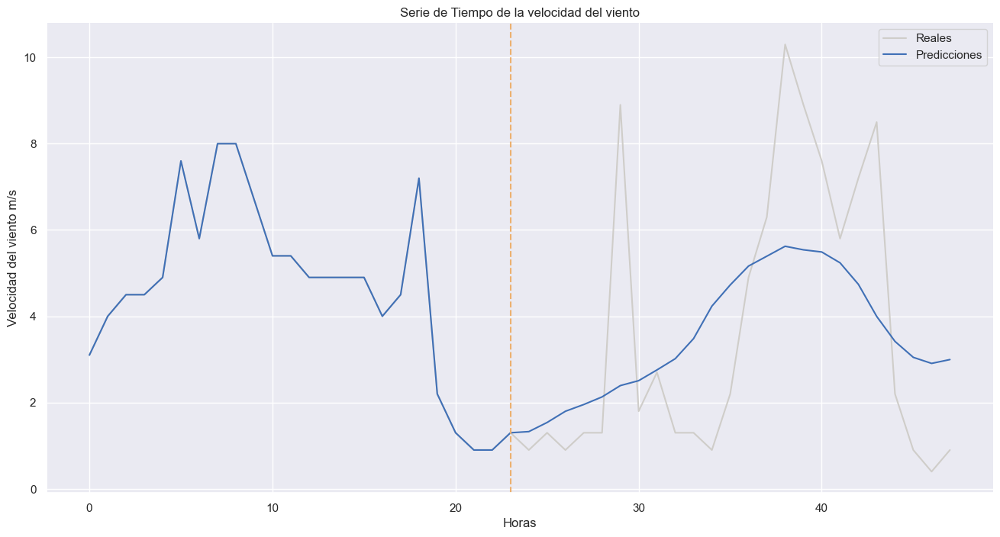

In [74]:
w_inv = np.hstack([p, pred_m])
w_inv
plot_series(m['High Wind Speed m/s'].values, w_inv, vline = True)

###### Resultados Junio 12 (MIMO)

In [75]:
r2 = r2_score(c['High Wind Speed m/s'].values, pred_m)
mae = mean_absolute_error(c['High Wind Speed m/s'].values, pred_m)
rmse = mean_squared_error(c['High Wind Speed m/s'].values, pred_m, squared= False)

print('Resultados: ' + 'r2: ' + str(r2) + 'mae: ' + str(mae) + 'rmse: ' + str(rmse))

Resultados: r2: 0.3883387046655885mae: 1.9538099661608495rmse: 2.5178569951743506


### Simulacion por dias Recursivo

In [60]:
combi = list_rect[5]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5
#else:
    #inicio = -1

df_SVR_test['Params']
model_parameters = df_SVR_test['Params']
minmax_scl = MinMaxScaler()

df_ = df_Nizanda.copy()
drop_cols = [col for col in df_Nizanda.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    


p = model_parameters[5]
print('---Parametros: ' +  str(model_parameters[5]) + '---')
model = SVR(C = p['C'][0], epsilon = p['epsilon'][0], gamma = p['gamma'][0], kernel = p['kernel'][0])
model.fit(x_train, y_train.ravel())    

(['High Wind Speed m/s'], 48, 1)
---Parametros: {'C': [1], 'epsilon': [0.01], 'gamma': [0.1], 'kernel': ['rbf']}---


SVR(C=1, epsilon=0.01, gamma=0.1)

#### Enero

Enero


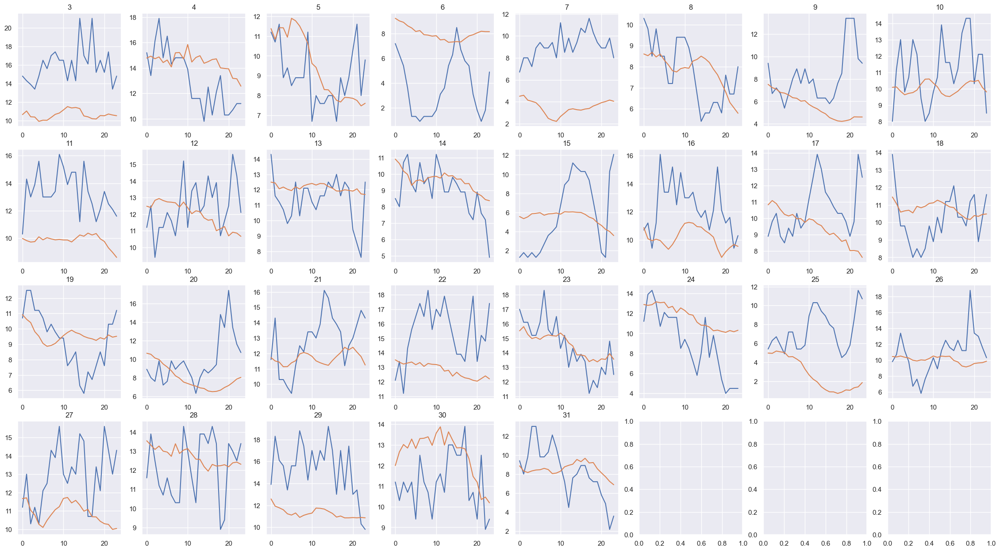

In [61]:
figure, axis = plt.subplots(1, 4, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[0]] # Enero
print(keys[0])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 1, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Febrero

Febrero


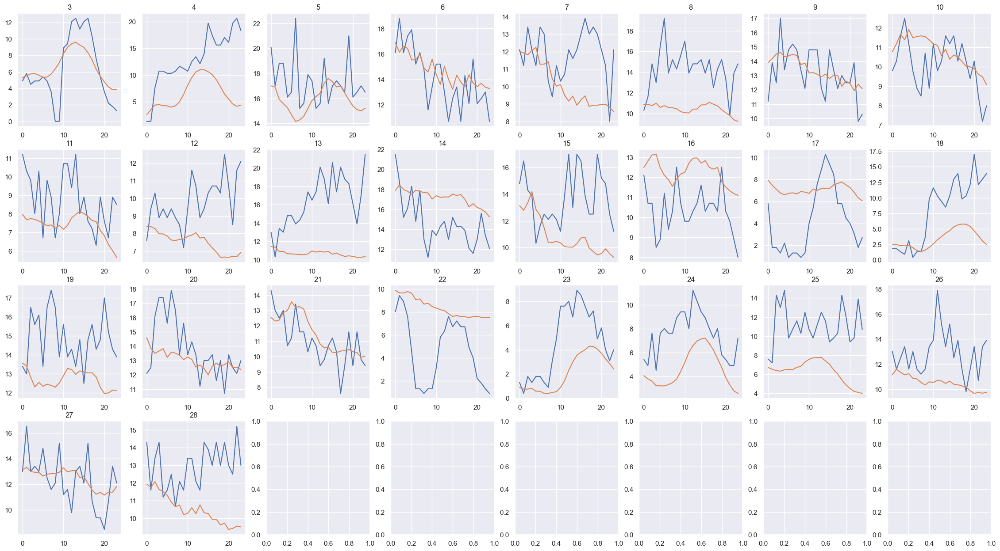

In [62]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[1]] # Febrero
print(keys[1])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 2, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Marzo

Marzo


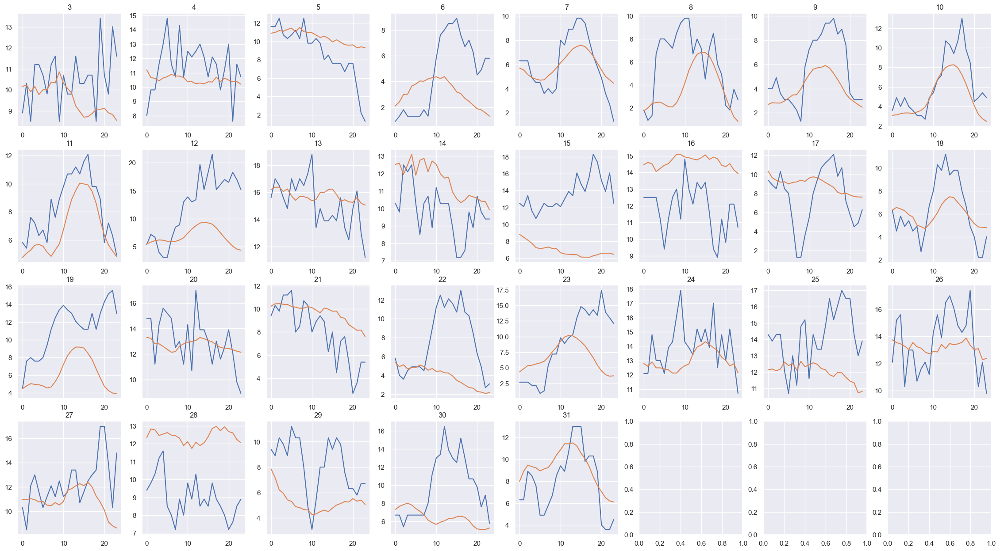

In [63]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[2]] # Marzo
print(keys[2])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 3, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Abril

Abril


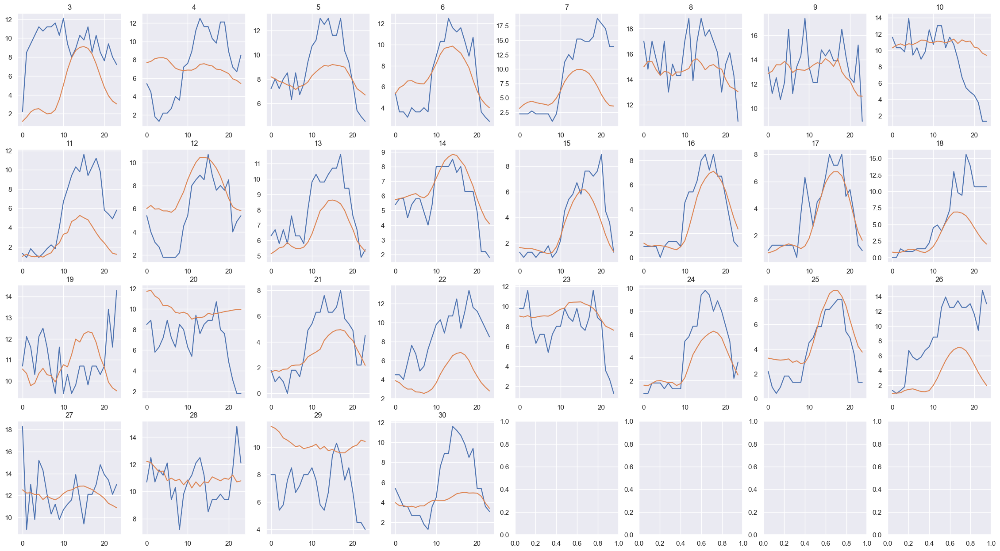

In [64]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[3]] # Abril
print(keys[3])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 4, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Mayo

Mayo


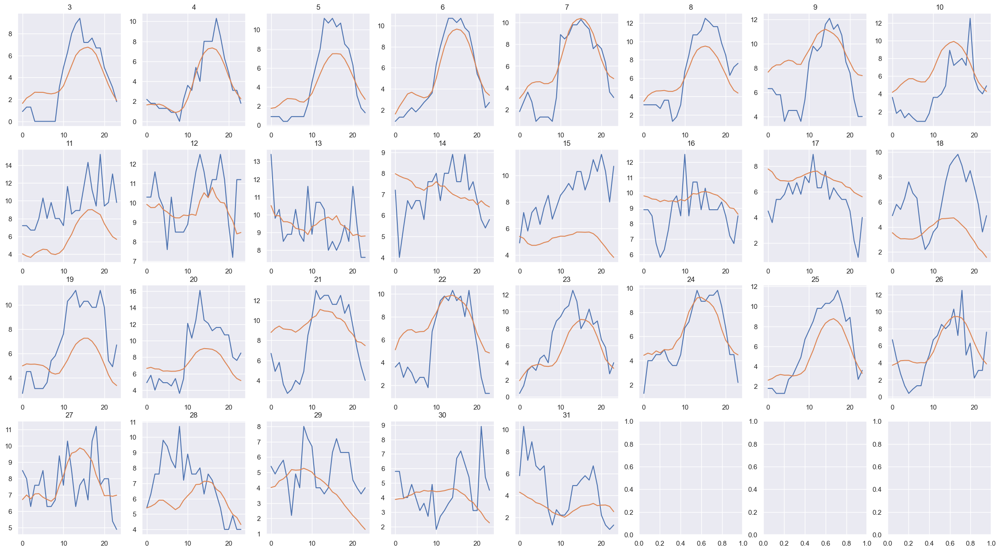

In [65]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[4]] # Mayo
print(keys[4])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 5, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Junio

Junio


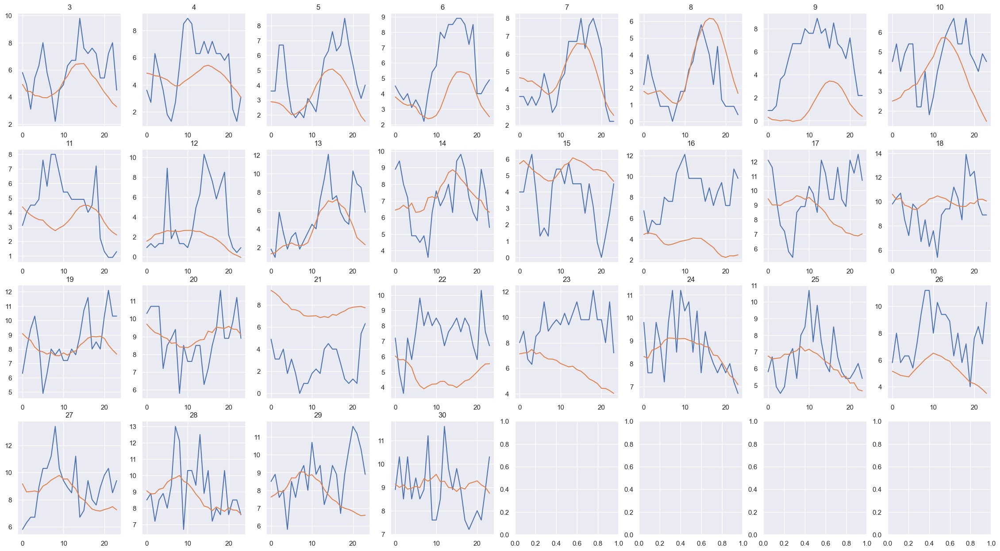

In [66]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[5]] # Junio
print(keys[5])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 6, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Julio

Julio


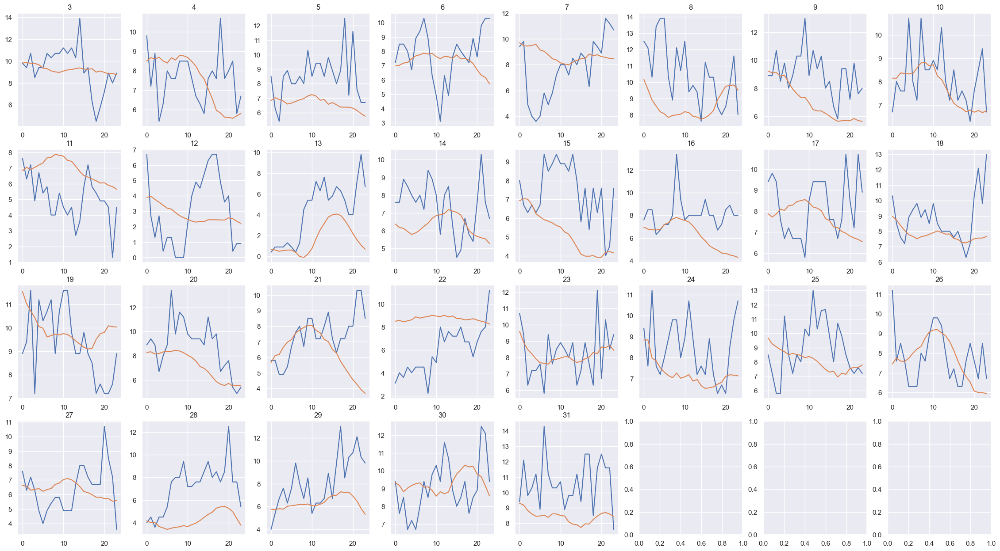

In [67]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[6]] # Julio
print(keys[6])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 7, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Agosto

Agosto


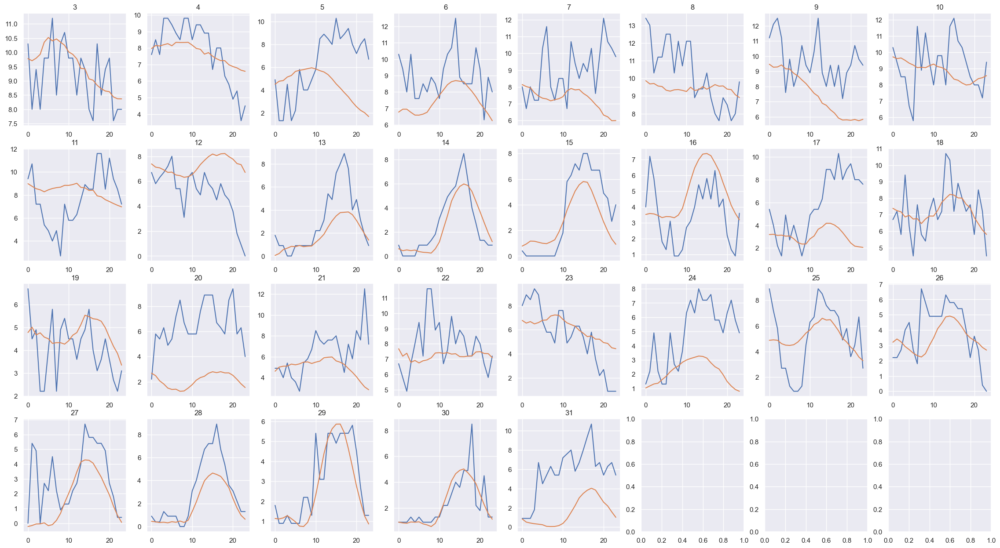

In [68]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[7]] # Julio
print(keys[7])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 8, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Septiembre

Septiembre


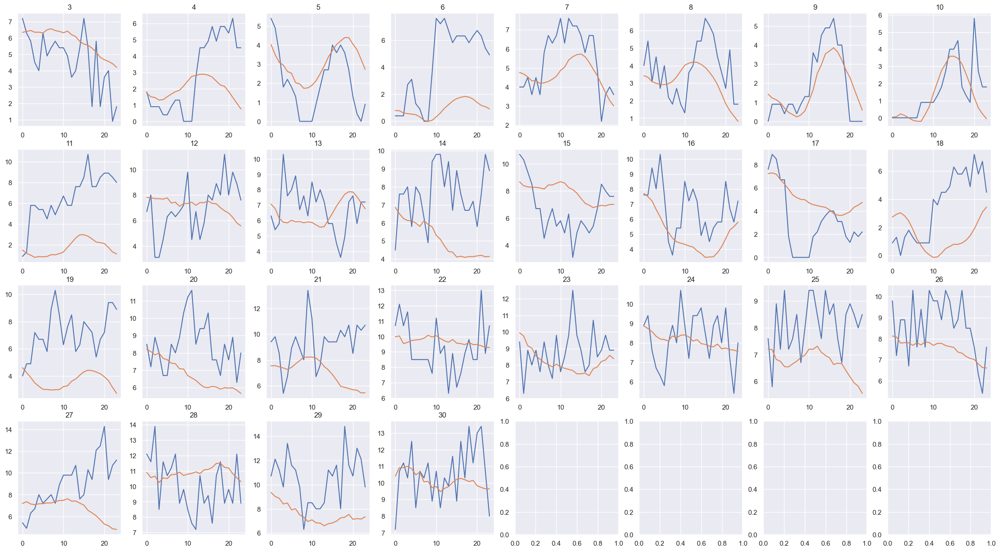

In [69]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[8]] # Julio
print(keys[8])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 9, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Octubre

Octubre


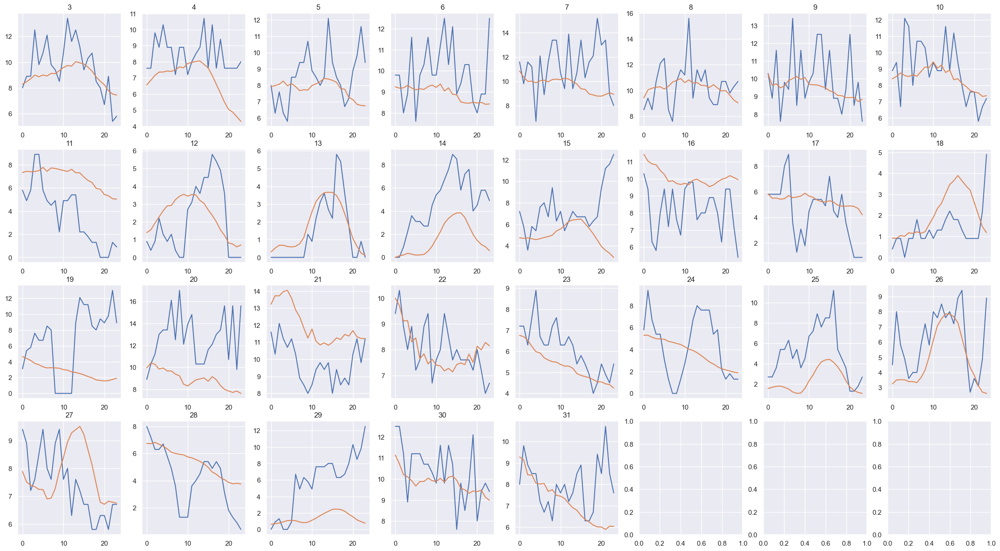

In [70]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[9]] # Julio
print(keys[9])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 10, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Noviembre

Novimebre


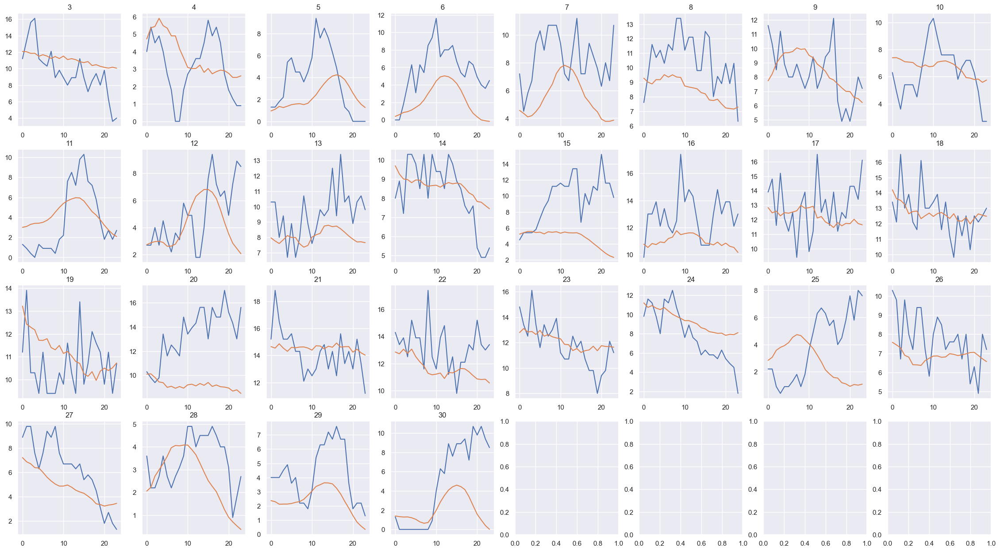

In [71]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[10]] # Noviembre
print(keys[10])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 11, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Diciembre

Diciembre


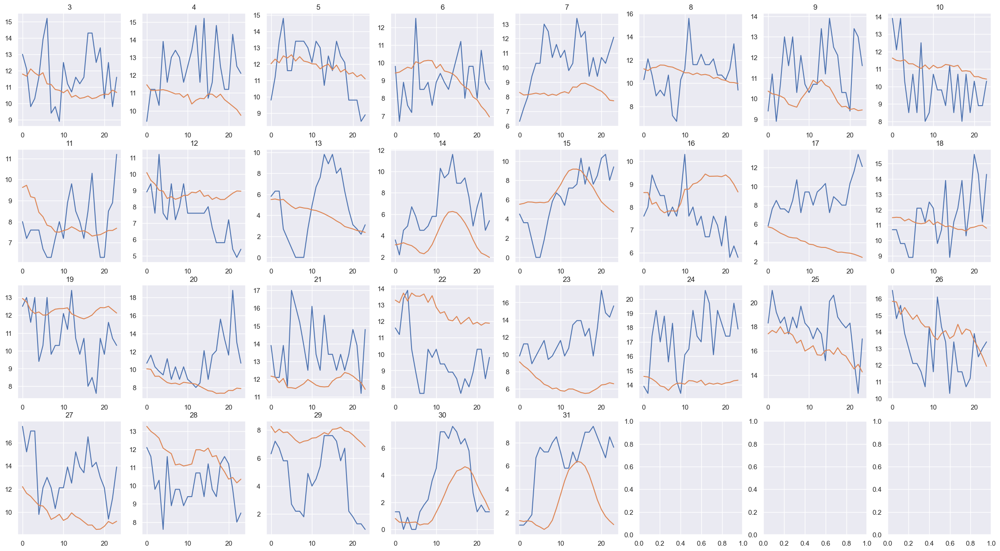

In [72]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[11]] # Diciembre
print(keys[11])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 12, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

### Simulacion por dias MIMO

In [16]:
combi = list_mimo[5]
print(combi)

inicio = 0
if combi[1] == 24:
    inicio = 2
elif combi[1] == 48:
    inicio = 3
if combi[1] == 72:
    inicio = 4
elif combi[1] == 96:
    inicio = 5
#else:
    #inicio = -1

#df_SVR_mimo_test['Params']
model_parameters = {'C': [10], 'epsilon': [0.001], 'gamma': [0.1], 'kernel': ['rbf']} #df_SVR_mimo_test['Params']
minmax_scl = MinMaxScaler()

df_ = df_Nizanda.copy()
drop_cols = [col for col in df_Nizanda.columns if col not in combi[0]]
df_.drop(drop_cols, axis = 1, inplace = True)

minmax_scl.fit(df_)

w, n_cols = data_preprocessing(df_, minmax_scl)
x_train, y_train = make_windows(w, input_size = combi[1], horizon = combi[2], shift = 0,  n_cols = n_cols)
        
if len(x_train.shape) > 2:
    # Convertir a arreglo de 2 dimensiones
    rows, nx, ny = x_train.shape
    x_train = x_train.reshape((rows, nx*ny))    


p = model_parameters
print('---Parametros: ' +  str(model_parameters) + '---')
model = MSVR(params = p)
model.fit(x_train, y_train)  

(['High Wind Speed m/s'], 48, 24)
---Parametros: {'C': [10], 'epsilon': [0.001], 'gamma': [0.1], 'kernel': ['rbf']}---


#### Enero

Enero


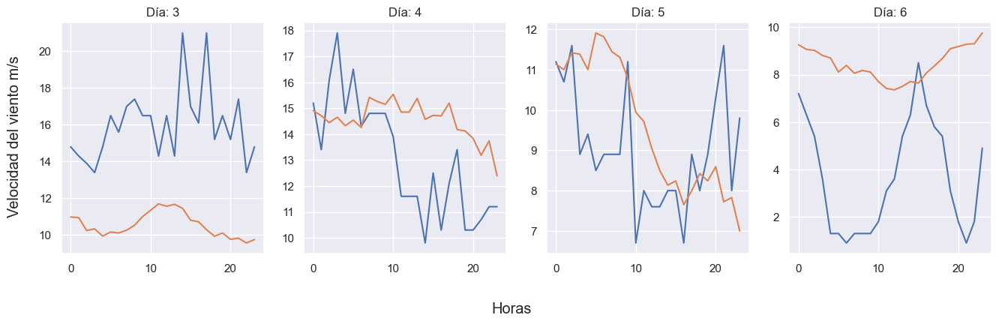

In [40]:
figure, axis = plt.subplots(1, 4, figsize=(16,4)) 
#plt.subplots_adjust(bottom=-0.3, right = 1.5)

figure.supxlabel('Horas', y = -0.1)
figure.supylabel('Velocidad del viento m/s', x = .08)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[0]] # Enero
print(keys[0])
for i in range(inicio, 7):
    m, p, c, pred = simulation(combi, 1, i, model, minmax_scl)
    axis[fila].plot(c['High Wind Speed m/s'].values)
    axis[fila].plot(pred)
    axis[fila].set_title('Día: ' + str(i))
    fila += 1
    
#    if dia % 8 == 0:
#        fila = 0
#        columna += 1
#    else:
#        fila += 1
#    dia += 1

plt.show()

#### Febrero

Febrero


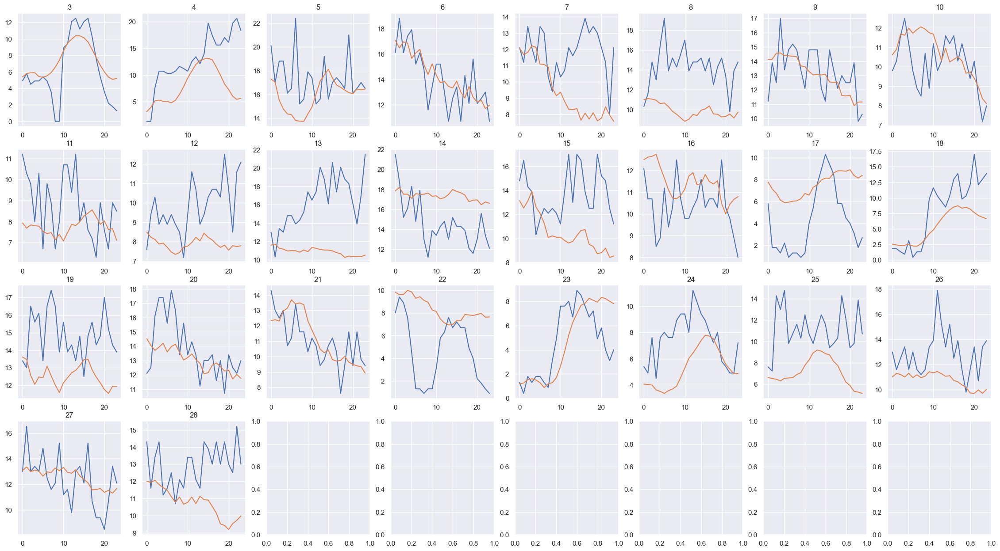

In [103]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[1]] # Febrero
print(keys[1])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 2, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Marzo

Marzo


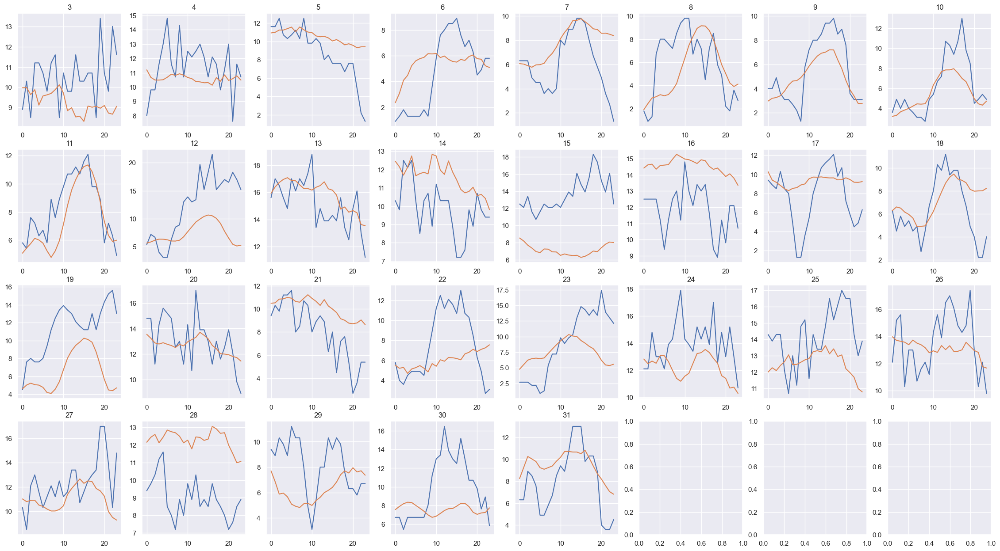

In [104]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[2]] # Marzo
print(keys[2])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 3, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Abril

Abril


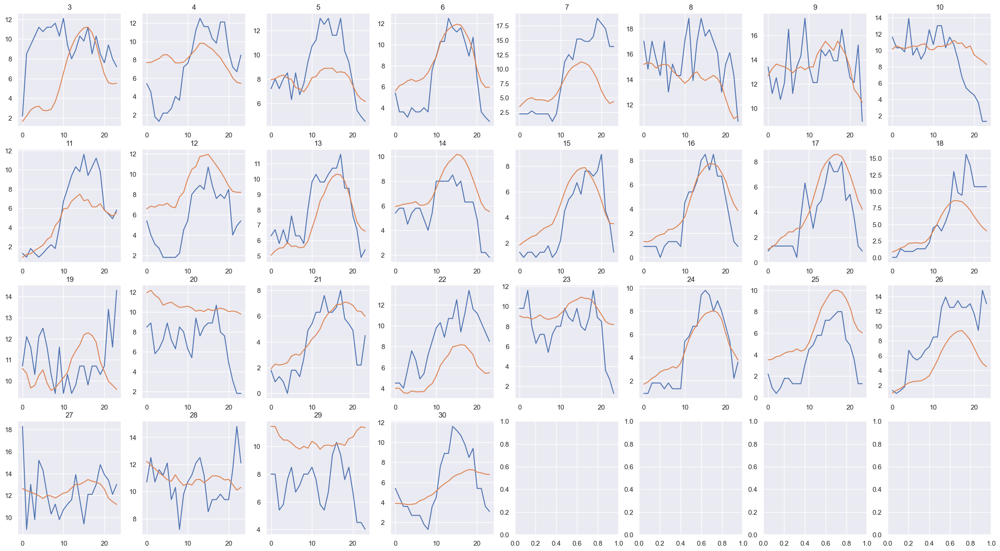

In [105]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[3]] # Abril
print(keys[3])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 4, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Mayo

Mayo


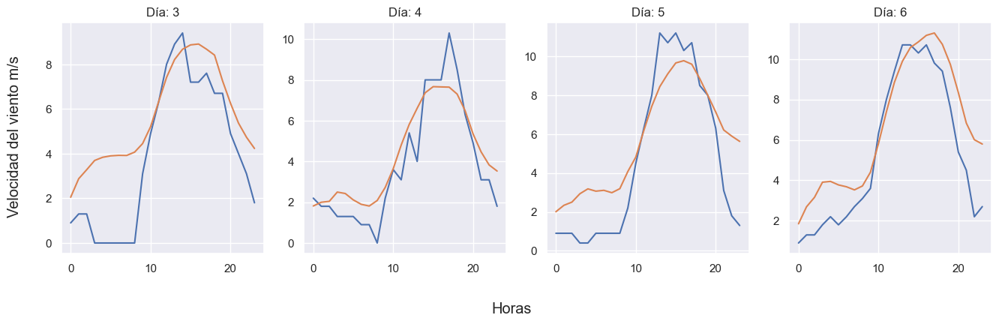

In [43]:
figure, axis = plt.subplots(1, 4, figsize=(16,4)) 
figure.supxlabel('Horas', y = -0.1)
figure.supylabel('Velocidad del viento m/s', x = .08)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[4]] # Mayo
print(keys[4])

for i in range(inicio, 7):
    m, p, c, pred = simulation(combi, 5, i, model, minmax_scl)
    axis[fila].plot(c['High Wind Speed m/s'].values)
    axis[fila].plot(pred)
    axis[fila].set_title('Día: ' + str(i))
    fila += 1
    
#    if dia % 8 == 0:
#        fila = 0
#        columna += 1
#    else:
#        fila += 1
#    dia += 1

plt.show()

#### Junio

Junio


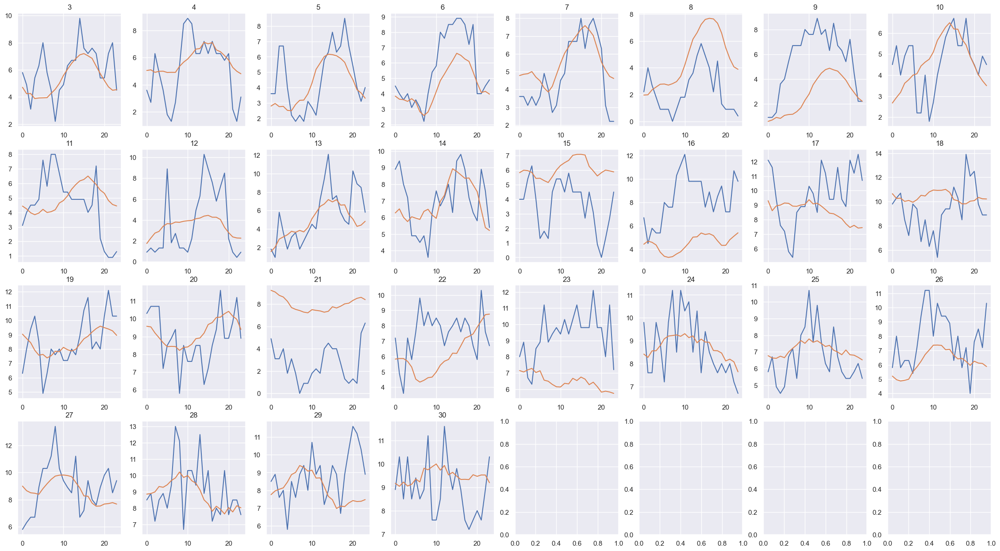

In [107]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[5]] # Junio
print(keys[5])

for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 6, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Julio

Julio


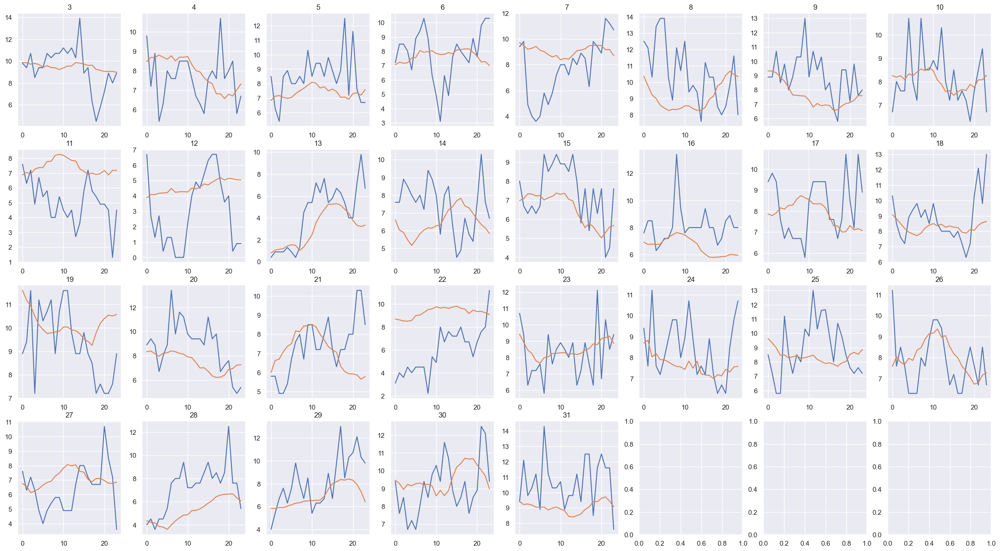

In [108]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[6]] # Julio
print(keys[6])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 7, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Agosto

Agosto


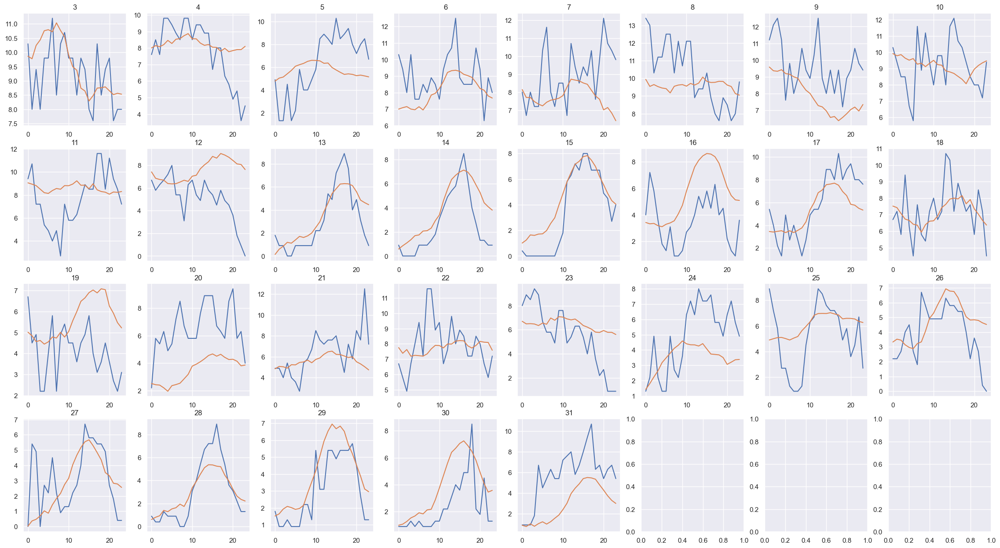

In [109]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[7]] # Julio
print(keys[7])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 8, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Septiembre

Septiembre


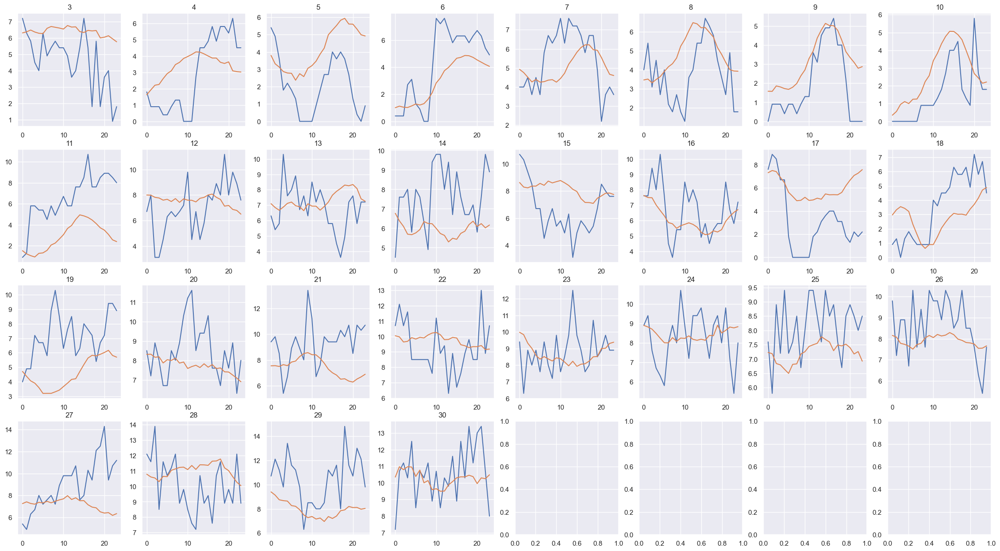

In [110]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[8]] # Julio
print(keys[8])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 9, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Octubre

Octubre


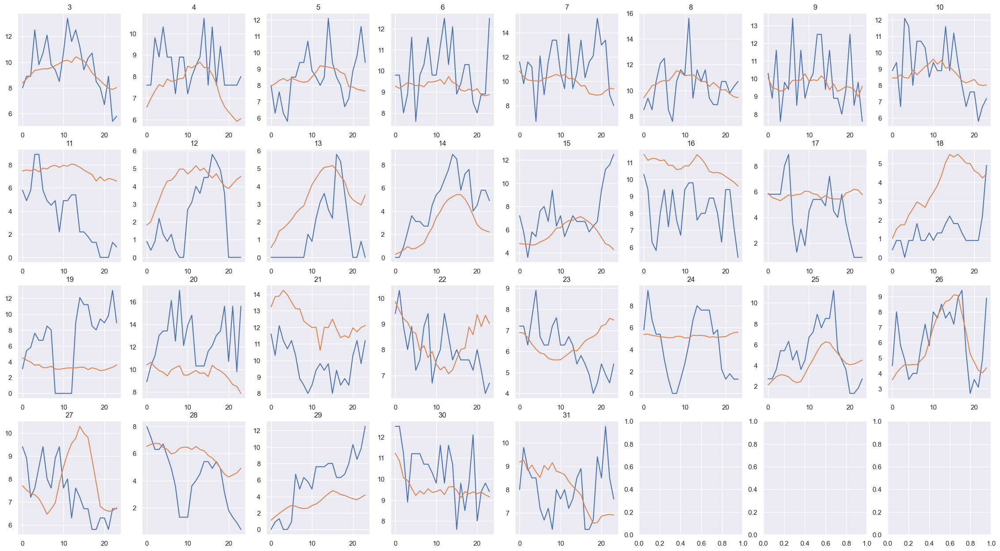

In [111]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[9]] # Julio
print(keys[9])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 10, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Noviembre

Novimebre


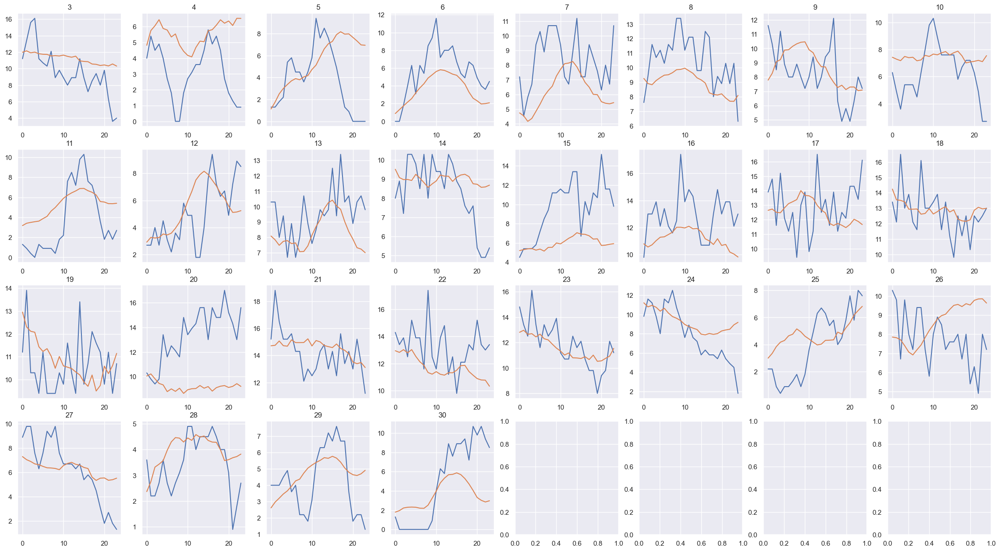

In [112]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[10]] # Noviembre
print(keys[10])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 11, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

#### Diciembre

Diciembre


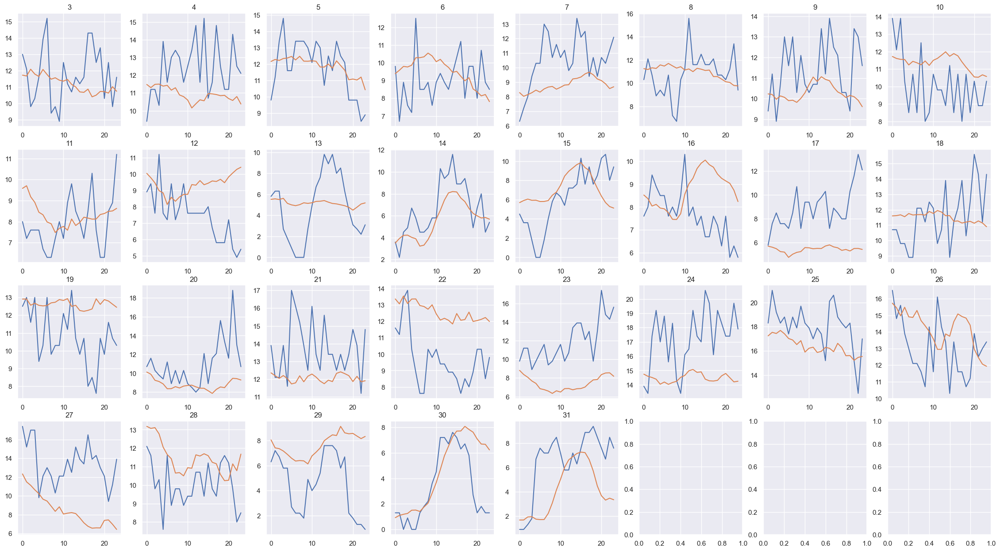

In [113]:
figure, axis = plt.subplots(4, 8, figsize=(16,10)) 
plt.subplots_adjust(bottom=-0.3, right = 1.5)

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[11]] # Diciembre
print(keys[11])
for i in range(inicio, len(df_mes['Day'].unique()) + 1):
    m, p, c, pred = simulation(combi, 12, i, model, minmax_scl)
    axis[columna, fila].plot(c['High Wind Speed m/s'].values)
    axis[columna, fila].plot(pred)
    axis[columna, fila].set_title(str(i))
    
    if dia % 8 == 0:
        fila = 0
        columna += 1
    else:
        fila += 1
    dia += 1

plt.show()

### velocidad del viento

In [22]:

fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[0]] # Enero
print(keys[0])

predicciones = []
for i in range(inicio, 7):
    m, p, c, pred = simulation(combi, 5, i, model, minmax_scl)
    predicciones.append(pred)

Enero


C:\Users\Angel\AppData\Local\Temp\ipykernel_3792\1254820114.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p.drop(drop_cols, axis = 1, inplace = True)
C:\Users\Angel\AppData\Local\Temp\ipykernel_3792\1254820114.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p.drop(drop_cols, axis = 1, inplace = True)
C:\Users\Angel\AppData\Local\Temp\ipykernel_3792\1254820114.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p.drop(drop_col

In [23]:
predicciones

[array([2.04927387, 2.87601256, 3.27966316, 3.69488253, 3.83663727,
        3.90060367, 3.92434441, 3.91879589, 4.06745347, 4.45027637,
        5.2063455 , 6.31726906, 7.41470793, 8.21206018, 8.67268057,
        8.86774648, 8.90694624, 8.67470347, 8.41150394, 7.26220794,
        6.2553492 , 5.36670492, 4.73444526, 4.23118825]),
 array([1.816079  , 1.99809126, 2.04300556, 2.49774307, 2.42760586,
        2.11524617, 1.89728696, 1.81310275, 2.08524869, 2.72624979,
        3.64264756, 4.80538059, 5.81399906, 6.61057233, 7.36720937,
        7.66830339, 7.65565032, 7.64446123, 7.30357429, 6.48881467,
        5.34403172, 4.46971052, 3.82862364, 3.5303163 ]),
 array([2.00850175, 2.33811683, 2.50196348, 2.93270697, 3.18414901,
        3.06579891, 3.10952951, 2.98722176, 3.193712  , 4.0765193 ,
        4.82032273, 6.17943868, 7.43235383, 8.44013129, 9.10018991,
        9.66009571, 9.77532677, 9.59472244, 8.8554327 , 8.00343733,
        7.13586321, 6.21210213, 5.8981794 , 5.62525394]),
 array([ 1

In [ ]:
[10.97678558, 10.94710922, 10.2398401 , 10.33257993,  9.93911561,
        10.16178614, 10.1091271 , 10.25977397, 10.53310699, 11.00342457,
        11.34595173, 11.69494606, 11.56439436, 11.6700003 , 11.45228534,
        10.80303222, 10.71925683, 10.28651868,  9.93083934, 10.10738459,
         9.76477362,  9.82484372,  9.56261525,  9.75209685]


[14.90364232, 14.71042622, 14.44195218, 14.65287222, 14.32413719,
        14.53903392, 14.25626971, 15.41548323, 15.26248606, 15.14728046,
        15.53710255, 14.85051237, 14.84768567, 15.379182  , 14.57216558,
        14.72272118, 14.70299118, 15.19665889, 14.17616924, 14.1211158 ,
        13.83543397, 13.18531557, 13.73598192, 12.3904497 ]


[11.13930757, 11.00268702, 11.42275217, 11.38487074, 11.00248086,
        11.91183518, 11.81832909, 11.44901811, 11.30883263, 10.78491477,
         9.94640051,  9.71569895,  9.04750133,  8.49851034,  8.13539235,
         8.24071457,  7.65148153,  7.9981296 ,  8.42271773,  8.24318783,
         8.59577565,  7.72439813,  7.82649602,  6.99855688]



[9.26171026, 9.0645847 , 9.0255554 , 8.80847569, 8.70209276,
        8.10885667, 8.39087217, 8.05901152, 8.17673893, 8.1094469 ,
        7.70764045, 7.41921348, 7.35958707, 7.50640886, 7.71200064,
        7.64241478, 8.06971512, 8.36521023, 8.68108384, 9.09485801,
        9.18593017, 9.28161936, 9.30529147, 9.75621592]

In [43]:
fila = 0
columna = 0
dia = 1
df_mes = Meses[keys[4]] # Enero
print(keys[4])

predicciones = []
for i in range(inicio, 7):
    m, p, c, pred = simulation(combi, 5, i, model, minmax_scl)
    predicciones.append(pred)

Mayo


C:\Users\Angel\AppData\Local\Temp\ipykernel_9096\1254820114.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p.drop(drop_cols, axis = 1, inplace = True)
C:\Users\Angel\AppData\Local\Temp\ipykernel_9096\1254820114.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p.drop(drop_cols, axis = 1, inplace = True)
C:\Users\Angel\AppData\Local\Temp\ipykernel_9096\1254820114.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p.drop(drop_col

In [44]:
predicciones

[array([2.04927387, 2.87601256, 3.27966316, 3.69488253, 3.83663727,
        3.90060367, 3.92434441, 3.91879589, 4.06745347, 4.45027637,
        5.2063455 , 6.31726906, 7.41470793, 8.21206018, 8.67268057,
        8.86774648, 8.90694624, 8.67470347, 8.41150394, 7.26220794,
        6.2553492 , 5.36670492, 4.73444526, 4.23118825]),
 array([1.816079  , 1.99809126, 2.04300556, 2.49774307, 2.42760586,
        2.11524617, 1.89728696, 1.81310275, 2.08524869, 2.72624979,
        3.64264756, 4.80538059, 5.81399906, 6.61057233, 7.36720937,
        7.66830339, 7.65565032, 7.64446123, 7.30357429, 6.48881467,
        5.34403172, 4.46971052, 3.82862364, 3.5303163 ]),
 array([2.00850175, 2.33811683, 2.50196348, 2.93270697, 3.18414901,
        3.06579891, 3.10952951, 2.98722176, 3.193712  , 4.0765193 ,
        4.82032273, 6.17943868, 7.43235383, 8.44013129, 9.10018991,
        9.66009571, 9.77532677, 9.59472244, 8.8554327 , 8.00343733,
        7.13586321, 6.21210213, 5.8981794 , 5.62525394]),
 array([ 1

In [20]:
model_filename = 'model_istmo.pkl'
pickle.dump(model, open(model_filename, 'wb'))

In [21]:
scaler_filename = 'scaler_istmo.pkl'
pickle.dump(minmax_scl, open(scaler_filename, 'wb'))